# Notebook summary of work 

In [1]:
# parent_folder_path = "/Users/haleyoro/Desktop/" # work on library computer
parent_folder_path = "/Users/Haley/Desktop/" # work on local computer


In [1]:
# !pip3 install pyabf
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyabf
import os
from waveforms_helpers2 import *
import pickle

Looking at the waveforms (from `Plotting` folder)

Annotations sheet --`App Script`--> unformatted csv files 

unformatted csv files --`process_excel`--> formatted csv files 

## `annotations_loader` : Make `sheets` dict with 38 dataframes of all processed .csvs

Load the cell types data frame to include info when reading .csv sheets

In [2]:
cell_types_df = pd.read_csv(parent_folder_path+"murray-neuroscience-lab/Cleaned, updated files from Spring/summary_spikes.csv")

cell_types_df.reset_index(drop=True,inplace=True)
sheets_types = cell_types_df["Cell"].unique().tolist()
print("Number of labeled sheets:",len(sheets_types))
cell_types_df

Number of labeled sheets: 25


,Cell,Motoneuron,Cell Type,Input Resistance,mean,median,min,max,total_spikes
0,2012_08_01_cell1,Low Rin Secondary,vSMN,287.00,24.97,24.52,18.47,38.55,41
1,2012_08_01_cell3,primary,MiP,49.99,42.55,42.84,29.46,52.69,65
2,2012_08_07,Low Rin Secondary,vSMN,219.00,29.31,31.48,10.54,38.93,67
3,2012_08_31_cell1,primary,MiP,45.33,39.28,38.40,26.93,52.55,64
4,2012_08_31_cell2,primary,vRoP,44.77,38.21,39.15,24.64,48.71,69
5,2012_08_31_cell3,primary,MiP,46.67,42.15,41.53,33.76,54.32,20
6,2012_08_31_cell4,Low Rin Secondary,dSMN,242.57,41.09,36.93,31.41,53.50,17
7,2012_10_04_cell2,Low Rin Secondary,dSMN,340.01,37.01,38.27,24.81,52.97,83
8,2012_12_03_cell1,High Rin Secondary,iSMN,830.00,28.02,26.69,19.99,51.63,465
9,2012_12_04_cell1,High Rin Secondary,vSMN,393.00,34.24,32.01,25.84,73.10,100


Create a dictionary looping through sheet names to load each sheet annotation as a data frame 
(.csv files were re-formatted using functions in `process_excel`, looping through the downloaded excel sheets from the annotations sheet in google drive. excel sheets were downloaded as .csvs using App Script code)

Keys are names of sheets

In [3]:
cell_types_df = pd.read_csv(parent_folder_path+"murray-neuroscience-lab/Cleaned, updated files from Spring/summary_spikes.csv")

cell_types_df.reset_index(drop=True,inplace=True)
sheets_types = cell_types_df["Cell"].unique().tolist()
sheet_names = cell_types_df.iloc[:,0].values
def make_sheets_dict(sheet_names,parent_folder_path):
    sheets = {}

    for sheet in sheet_names:
        file_path = parent_folder_path+"murray-neuroscience-lab/New processed excels/"+sheet+".csv"
        df = pd.read_csv(file_path)
        df[["Trace name","Tags","Type"]] = df[["Trace name","Tags","Type"]].astype("string")
        types = cell_types_df[cell_types_df["Cell"]==sheet]
        df.loc[:,"Median Spiking"] = types.iloc[0]["median"]
        df.loc[:,"Mean Spiking"] = types.iloc[0]["mean"]
        sheets[sheet] = df

    return sheets
sheets = make_sheets_dict(sheet_names,parent_folder_path)
sheets.keys()

dict_keys(['2012_08_01_cell1', '2012_08_01_cell3', '2012_08_07', '2012_08_31_cell1', '2012_08_31_cell2', '2012_08_31_cell3', '2012_08_31_cell4', '2012_10_04_cell2', '2012_12_03_cell1', '2012_12_04_cell1', '2012_12_05_cell1', '2012_12_05_cell3', '2012_12_05_cell4', '2012_12_06_cell1', '2012_12_06_cell4', '2013_03_20_cell1', '2013_03_21_cell1', '2013_03_21_cell3', '2013_03_21_cell4', '2013_03_21_cell5', '2013_03_22_cell1', '2013_03_22_cell2', '2013_03_22_cell4', '2013_03_22_cell5', '2013_03_22_cell6'])

Using one sheet name to access the formatted dataframe of the annotations, includes cell type and resistance

## `binwaves_` : make abfs dict to store .abf files for each of the 38 sheets

make `abfs` dict: contains the abf file of each trace in the annotation df sheet

need abfs[trace] and sheets[sheet[sheet["Trace name"]==Trace]]. test with one:

use loops in annotations loader to make mega dict

In [4]:
parent_folder_path_ABFS ="/Users/Haley/Desktop/ABF files annotated"
abfs_names = pd.read_csv(parent_folder_path+"murray-neuroscience-lab/Cleaned, updated files from Spring/all_trace_names.csv",header = None)
abfs_names = abfs_names.iloc[:,0].to_numpy()
abfs_names

array(['2012_04_25_0004', '2012_04_25_0005', '2012_04_25_0006', ...,
       '2013_03_22_0062', '2013_03_22_0063', '2012_10_04_0014'],
      shape=(242,), dtype=object)

2012_03_21_0027.abf not in drive folder

In [5]:
sheets_abfs = add_abfs(sheets,abfs_names,parent_folder_path_ABFS)
sheets_abfs.keys()

dict_keys(['2012_08_01_cell1', '2012_08_01_cell3', '2012_08_07', '2012_08_31_cell1', '2012_08_31_cell2', '2012_08_31_cell3', '2012_08_31_cell4', '2012_10_04_cell2', '2012_12_03_cell1', '2012_12_04_cell1', '2012_12_05_cell1', '2012_12_05_cell3', '2012_12_05_cell4', '2012_12_06_cell1', '2012_12_06_cell4', '2013_03_20_cell1', '2013_03_21_cell1', '2013_03_21_cell3', '2013_03_21_cell4', '2013_03_21_cell5', '2013_03_22_cell1', '2013_03_22_cell2', '2013_03_22_cell4', '2013_03_22_cell5', '2013_03_22_cell6'])

In [ ]:
abf_names = []
abf_annotations = []

for sheet in sheets.keys():
    # print(f"\nProcessing sheet: {sheet}")

    try:
        traces_abfs = sorted(sheets_abfs[sheet]['abfs'].keys())
        # print(f"  Found ABF traces: {traces_abfs}")
        abf_names.extend(traces_abfs)
    except KeyError as e:
        print(f"  Missing 'abfs' for sheet {sheet}: {e}")
    
    try:
        annotations = sheets_abfs[sheet]["annotations"]
        # print(f"  Annotations columns: {annotations.columns}")
        traces_annotated = sorted(annotations["Trace name"].unique().tolist())
        # print(f"  Found annotations: {traces_annotated}")
        abf_annotations.extend(traces_annotated)
    except KeyError as e:
        print(f"  Missing 'annotations' or 'Trace name' column: {e}")
    except AttributeError as e:
        print(f"  'annotations' is not a DataFrame? {e}")


`sheets` is now a dictionary with `annotations` dataframe and `abfs` dict.
sheet names are still the keys

In [16]:
def plot_motorneuron_activity(abf):
    fig = plt.figure(figsize=(15, 4))
    # plot the first channel
    abf.setSweep(sweepNumber=0, channel=0)
    plt.plot(abf.sweepX, abf.sweepY, label="Channel 1",linewidth = 0.3,color='maroon')
    y_min, y_max = get_std_range(abf.sweepY)

    # decorate the plot
    plt.title("Motor Neuron Activity")
    plt.ylabel(abf.sweepLabelY)
    plt.xlabel(abf.sweepLabelX)
    plt.axis([0, 1, y_min, y_max]) # x bound, y bound
    plt.legend()
    plt.show()

def get_std_range(array, stdnum=8):
    """
    Returns the lower and upper bounds of a region centered at the mean
    that contains the given percentage of the data, assuming a normal distribution.

    Returns:
    - (lower_bound, upper_bound)
    """
    mean = np.mean(array)
    std = np.std(array)

    lower = mean - stdnum * std
    upper = mean + stdnum * std
    return lower, upper


def plot_ventralroot_bursts(abf):   
    fig = plt.figure(figsize=(15, 4))

    # plot the second channel
    abf.setSweep(sweepNumber=0, channel=1)
    plt.plot(abf.sweepX, abf.sweepY, label="Channel 2",linewidth = 0.3,color='green')

    # decorate the plot
    plt.title("Spike Timing")
    plt.ylabel(abf.sweepLabelY)
    plt.xlabel(abf.sweepLabelX)
    plt.axis([0, 1, -0.2, 0.2]) # x bound, y bound
    plt.legend()
    plt.show()


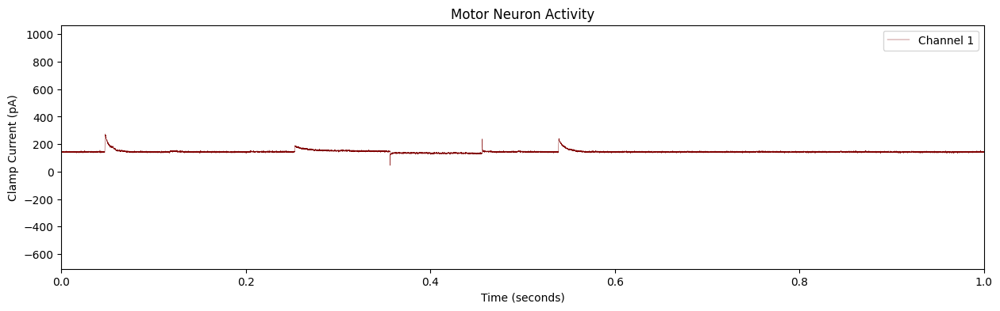

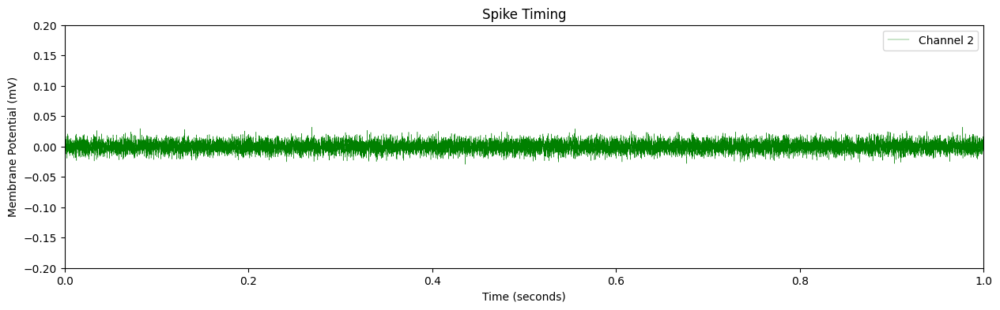

In [ ]:
abf = sheets_abfs['2012_08_01_cell1']['abfs']['2012_08_01_0009']
plot_motorneuron_activity(abf)
plot_ventralroot_bursts(abf)
annotations = sheets_abfs['2012_08_01_cell1']['annotations']
annotations[annotations['Trace name'] == '2012_08_01_0009']

In [25]:
def get_abf_and_annotations(abf_name, sheets_abfs):
    """
    Given an abf_name, return the abf file object and its corresponding
    annotations DataFrame subset.

    Parameters
    ----------
    abf_name : str
        The abf filename to look up (e.g., '2012_08_01_0009').
    sheets_abfs : dict
        Dictionary with structure:
        {sheet_name: {"abfs": {abf_name: abf_obj}, "annotations": DataFrame}}

    Returns
    -------
    tuple
        (abf_obj, annotations_subset) if found,
        otherwise (None, None).
    """
    for sheet, content in sheets_abfs.items():
        if abf_name in content["abfs"]:
            abf_obj = content["abfs"][abf_name]
            annotations_df = content["annotations"]
            annotations_subset = annotations_df[annotations_df["Trace name"] == abf_name]
            return abf_obj, annotations_subset
    return None, None


In [28]:
abf, annotations = get_abf_and_annotations('2012_08_01_0009', sheets_abfs)
# print(abf)       # The ABF object
# print(annotations)    # Filtered annotations DataFrame

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def _extract_bout_windows(
    annotations: pd.DataFrame,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,  # 10 ms
):
    """
    Return a list of (start, end) windows in seconds, padded by pad_s on both sides.
    Robust to multiple bouts; pairs starts to the next end in chronological order.
    If only a start (or only an end) exists, creates a ±pad_s window around that tag time.
    """
    df = annotations.copy()
    # Normalize tags for matching
    def _has_kw(x, kw): 
        return isinstance(x, str) and (kw in x.lower())
    df["_is_start"] = df[tags_col].apply(lambda x: _has_kw(x, start_kw))
    df["_is_end"]   = df[tags_col].apply(lambda x: _has_kw(x, end_kw))
    df = df.sort_values(seconds_col, kind="mergesort")  # stable order

    starts = df.loc[df["_is_start"], seconds_col].to_list()
    ends   = df.loc[df["_is_end"], seconds_col].to_list()

    windows = []
    si, ei = 0, 0

    # Pair starts to subsequent ends
    while si < len(starts) and ei < len(ends):
        s = starts[si]
        # find the first end that occurs after this start
        while ei < len(ends) and ends[ei] < s:
            ei += 1
        if ei >= len(ends):
            break
        e = ends[ei]
        windows.append((max(0.0, s - pad_s), e + pad_s))
        si += 1
        ei += 1

    # If there are unmatched starts, make small ±pad windows
    while si < len(starts):
        s = starts[si]
        windows.append((max(0.0, s - pad_s), s + pad_s))
        si += 1

    # If there are ends with no prior starts, make small ±pad windows
    while ei < len(ends):
        e = ends[ei]
        windows.append((max(0.0, e - pad_s), e + pad_s))
        ei += 1

    # If we found nothing at all but have any timestamps, make a single ±pad window around each
    if not windows and seconds_col in annotations.columns and len(annotations) > 0:
        for t in annotations[seconds_col].astype(float).to_list():
            windows.append((max(0.0, t - pad_s), t + pad_s))

    # Merge overlapping/adjacent windows for a clean xlim
    if windows:
        windows = sorted(windows)
        merged = [windows[0]]
        for a, b in windows[1:]:
            ca, cb = merged[-1]
            if a <= cb:  # overlap or touching
                merged[-1] = (ca, max(cb, b))
            else:
                merged.append((a, b))
        return merged
    return []


def plot_ventralroot_bursts_with_bouts(
    abf,
    annotations: pd.DataFrame,
    *,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    ylim=(-0.2, 0.2),
    title="Spike Timing with Bouts"
):
    """
    Plots the trace and zooms the x-axis from 10 ms before the first bout start
    to 10 ms after the last bout end. Overlays shaded bout spans + vertical lines.
    """
    # Prepare data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # Compute bout windows (±10 ms)
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )

    # Choose overall xlim: first start to last end; fallback to full sweep if no windows
    if windows:
        x_start = windows[0][0]
        x_end   = windows[-1][1]
    else:
        x_start, x_end = float(x.min()), float(x.max())

    # Plot
    fig = plt.figure(figsize=(15, 4))
    ax = plt.gca()
    ax.plot(x, y, label=f"Channel {channel+1}", linewidth=0.3)

    # Overlay spans and vertical markers
    for (a, b) in windows:
        ax.axvspan(a, b, alpha=0.15)
        ax.axvline(a + pad_s, linestyle="--", linewidth=1, alpha=0.9)  # approx start tag
        ax.axvline(b - pad_s, linestyle="--", linewidth=1, alpha=0.9)  # approx end tag

    # If you want exact tag lines too (not just padded edges), draw them:
    if len(annotations) > 0:
        for _, row in annotations.iterrows():
            t = float(row[seconds_col])
            ax.axvline(t, linestyle=":", linewidth=0.8, alpha=0.7)

    # Decorate
    ax.set_title(title)
    ax.set_ylabel(abf.sweepLabelY)
    ax.set_xlabel(abf.sweepLabelX)
    ax.set_ylim(*ylim)
    ax.set_xlim(x_start, x_end)
    ax.legend()
    plt.show()


In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def _extract_bout_windows(
    annotations: pd.DataFrame,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,  # 10 ms padding
):
    """Return merged list of (start, end) bout windows in seconds, padded by pad_s."""
    df = annotations.copy()

    def _has_kw(x, kw):
        return isinstance(x, str) and kw in x.lower()

    start_kw = start_kw.lower()
    end_kw   = end_kw.lower()

    df["_is_start"] = df[tags_col].apply(lambda x: _has_kw(x, start_kw))
    df["_is_end"]   = df[tags_col].apply(lambda x: _has_kw(x, end_kw))
    df = df.sort_values(seconds_col, kind="mergesort")

    starts = df.loc[df["_is_start"], seconds_col].astype(float).to_list()
    ends   = df.loc[df["_is_end"],   seconds_col].astype(float).to_list()

    windows, si, ei = [], 0, 0
    while si < len(starts) and ei < len(ends):
        s = starts[si]
        while ei < len(ends) and ends[ei] < s:
            ei += 1
        if ei >= len(ends):
            break
        e = ends[ei]
        windows.append((max(0.0, s - pad_s), e + pad_s))
        si += 1
        ei += 1

    while si < len(starts):  # unmatched starts
        s = starts[si]
        windows.append((max(0.0, s - pad_s), s + pad_s))
        si += 1

    while ei < len(ends):  # unmatched ends
        e = ends[ei]
        windows.append((max(0.0, e - pad_s), e + pad_s))
        ei += 1

    if not windows and len(annotations) > 0 and seconds_col in annotations.columns:
        for t in annotations[seconds_col].astype(float).to_list():
            windows.append((max(0.0, t - pad_s), t + pad_s))

    # merge overlapping/touching
    if not windows:
        return []
    windows = sorted(windows)
    merged = [windows[0]]
    for a, b in windows[1:]:
        ca, cb = merged[-1]
        if a <= cb:
            merged[-1] = (ca, max(cb, b))
        else:
            merged.append((a, b))
    return merged


def plot_bouts(
    abf,
    annotations: pd.DataFrame,
    *,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    ylim = (-0.2, 0.2),
    ncols: int = 2,
    max_bouts: int | None = None,
    draw_exact_tag_lines: bool = True,
    title_prefix: str = "Bout"
):
    """
    Plot the ABF sweep zoomed into each bout window (±pad_s), one panel per bout.

    Parameters
    ----------
    abf : pyABF.ABF
    annotations : pd.DataFrame (filtered to this ABF)
    channel, sweep : which trace to plot
    seconds_col, tags_col, start_kw, end_kw : annotation parsing controls
    pad_s : float  padding (seconds) before start and after end
    ylim : tuple   y-limits for all panels
    ncols : int    subplot columns
    max_bouts : int | None  limit number of bouts plotted (for long recordings)
    draw_exact_tag_lines : bool  draw dotted lines at raw tag times too
    title_prefix : str  panel title prefix
    """
    # Prepare ABF data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # Compute windows
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw,
        end_kw=end_kw,
        pad_s=pad_s,
    )
    if not windows:
        print("No bout windows found.")
        return []

    if max_bouts is not None:
        windows = windows[:max_bouts]

    n = len(windows)
    nrows = int(np.ceil(n / ncols))

    fig, axes = plt.subplots(nrows, ncols, figsize=(8*ncols, 3.2*nrows), squeeze=False)
    axes = axes.ravel()

    for i, (a, b) in enumerate(windows):
        ax = axes[i]
        ax.plot(x, y, linewidth=0.6, label=f"Ch {channel+1}")
        ax.axvspan(a, b, alpha=0.15)
        # dashed at padded edges
        ax.axvline(a, linestyle="--", linewidth=0.8, alpha=0.9)
        ax.axvline(b, linestyle="--", linewidth=0.8, alpha=0.9)

        if draw_exact_tag_lines and len(annotations) > 0:
            for _, row in annotations.iterrows():
                t = float(row[seconds_col])
                if a <= t <= b:
                    ax.axvline(t, linestyle=":", linewidth=0.8, alpha=0.7)

        ax.set_xlim(a, b)
        ax.set_ylim(*ylim)
        ax.set_title(f"{title_prefix} {i+1}  [{a:.3f}s–{b:.3f}s]")
        ax.set_ylabel(abf.sweepLabelY)
        ax.set_xlabel(abf.sweepLabelX)

    # Hide any unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    fig.tight_layout()
    plt.show()

    return windows


In [35]:
import matplotlib.pyplot as plt

def plot_single_bout(
    abf,
    annotations,
    bout_index: int = 0,
    *,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    ylim=(-0.2, 0.2),
    title_prefix="Bout",
    draw_exact_tag_lines=True,
):
    """
    Plot a single bout window (±pad_s) from an ABF trace.

    Parameters
    ----------
    abf : pyABF.ABF
    annotations : pd.DataFrame
        Annotation rows for this ABF.
    bout_index : int
        Which bout to plot (0-based).
    channel, sweep : int
        Which trace to plot.
    seconds_col, tags_col, start_kw, end_kw : str
        How to parse bouts.
    pad_s : float
        Padding before/after bout (seconds).
    ylim : tuple
        y-axis limits.
    title_prefix : str
        Title prefix for plot.
    draw_exact_tag_lines : bool
        Whether to mark raw tag times with dotted lines.
    """
    # reuse window extractor
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw,
        end_kw=end_kw,
        pad_s=pad_s,
    )
    if not windows:
        raise ValueError("No bout windows found.")
    if bout_index >= len(windows):
        raise IndexError(f"bout_index {bout_index} out of range (found {len(windows)} bouts).")

    a, b = windows[bout_index]

    # get sweep data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # plot
    fig, ax = plt.subplots(figsize=(12, 4))
    ax.plot(x, y, linewidth=0.6, label=f"Channel {channel+1}")
    ax.axvspan(a, b, alpha=0.15, color="orange")
    ax.axvline(a, linestyle="--", linewidth=0.8, alpha=0.9)
    ax.axvline(b, linestyle="--", linewidth=0.8, alpha=0.9)

    if draw_exact_tag_lines and len(annotations) > 0:
        for _, row in annotations.iterrows():
            t = float(row[seconds_col])
            if a <= t <= b:
                ax.axvline(t, linestyle=":", linewidth=0.8, alpha=0.7)

    ax.set_xlim(a, b)
    ax.set_ylim(*ylim)
    ax.set_title(f"{title_prefix} {bout_index+1}  [{a:.3f}s–{b:.3f}s]")
    ax.set_ylabel(abf.sweepLabelY)
    ax.set_xlabel(abf.sweepLabelX)
    ax.legend()
    plt.show()

    return (a, b)


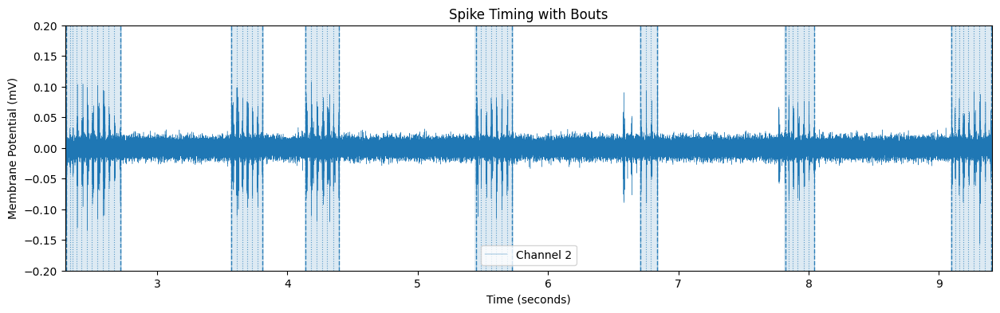

In [32]:
# ann is your annotations filtered to this ABF (one file’s rows)
plot_ventralroot_bursts_with_bouts(
    abf,
    annotations,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    start_kw="bout start",
    end_kw="bout end",
    pad_s=0.010  # 10 ms
)


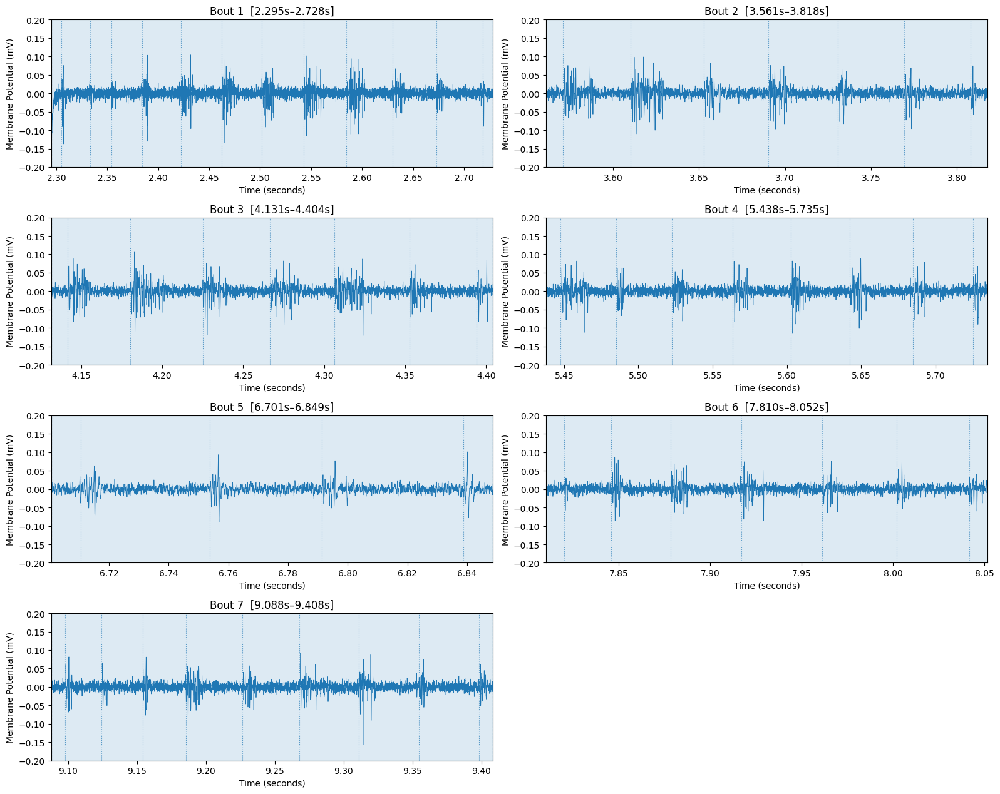

[(2.29481, 2.7284599999999997),
 (3.5609800000000003, 3.81783),
 (4.131430000000001, 4.40418),
 (5.4377200000000006, 5.735180000000001),
 (6.70061, 6.84868),
 (7.8102100000000005, 8.051680000000001),
 (9.08765, 9.408389999999999)]

In [34]:
# ann = annotations filtered to this ABF (e.g., via your get_abf_and_annotations)
plot_bouts(
    abf,
    annotations,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    start_kw="bout start",
    end_kw="bout end",
    pad_s=0.010,   # 10 ms before/after
    ncols=2,
    ylim=(-0.2, 0.2)
)


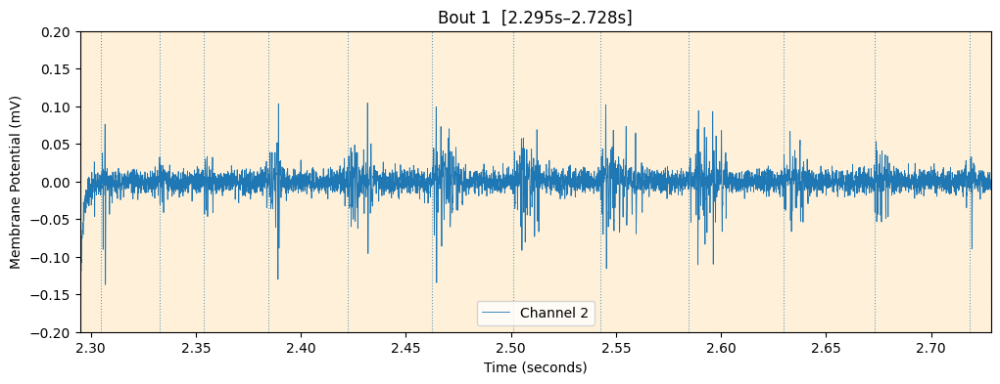

(2.29481, 2.7284599999999997)

In [36]:
# ann = annotations filtered to this ABF
plot_single_bout(
    abf,
    annotations,
    bout_index=0,       # first bout
    channel=1,
    sweep=0,
    pad_s=0.010,        # 10 ms padding
    ylim=(-0.2, 0.2)
)


In [37]:
import numpy as np
import pandas as pd

def mean_std_between_bouts(
    abf,
    annotations: pd.DataFrame,
    *,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010
):
    """
    Calculate mean and std of ABF signal in regions between swimming bouts
    (outside bout windows padded by pad_s).

    Parameters
    ----------
    abf : pyABF.ABF
        ABF object already loaded.
    annotations : DataFrame
        Annotations for this ABF (filtered to one Trace name).
    channel : int
        ABF channel to use.
    sweep : int
        Sweep index.
    seconds_col : str
        Column in annotations with event time (s).
    tags_col : str
        Column in annotations with event tags.
    start_kw : str
        Keyword to detect bout start.
    end_kw : str
        Keyword to detect bout end.
    pad_s : float
        Padding (seconds) before start and after end.

    Returns
    -------
    tuple
        (mean, std) of values outside bout windows.
    """
    # get data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # reuse bout window extraction
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )

    mask = np.ones_like(y, dtype=bool)  # start with everything included

    for (a, b) in windows:
        mask &= ~((x >= a) & (x <= b))  # mark bout regions as False

    between_vals = y[mask]

    if between_vals.size == 0:
        return np.nan, np.nan  # no between-bout data

    return float(np.mean(between_vals)), float(np.std(between_vals))


In [ ]:
import matplotlib.pyplot as plt

def plot_between_bout_histogram(
    abf,
    annotations: pd.DataFrame,
    *,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    bins: int = 50
):
    """
    Plot histogram of ABF values in between swimming bouts.
    Marks the mean and ±1 std dev.
    """
    # get data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # reuse bout window extraction
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )

    mask = np.ones_like(y, dtype=bool)
    for (a, b) in windows:
        mask &= ~((x >= a) & (x <= b))

    between_vals = y[mask]

    if between_vals.size == 0:
        print("⚠️ No between-bout data available.")
        return

    mean_val = float(np.mean(between_vals))
    std_val  = float(np.std(between_vals))

    # plot histogram
    plt.figure(figsize=(10, 5))
    plt.hist(between_vals, bins=bins, color="lightblue", edgecolor="black", alpha=0.7)
    
    # mean line
    plt.axvline(mean_val, color="red", linestyle="-", linewidth=2, label=f"Mean = {mean_val:.3f}")
    # std dev lines
    plt.axvline(mean_val - std_val, color="green", linestyle="--", linewidth=2, label=f"Mean - 1 SD = {mean_val-std_val:.3f}")
    plt.axvline(mean_val + std_val, color="green", linestyle="--", linewidth=2, label=f"Mean + 1 SD = {mean_val+std_val:.3f}")

    plt.title("Histogram of Between-Bout Signal Values")
    plt.xlabel("Signal Amplitude")
    plt.ylabel("Count")
    plt.legend()
    plt.show()

    return mean_val, std_val


In [41]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_bout_vs_between_histogram(
    abf,
    annotations: pd.DataFrame,
    *,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    bins: int = 50
):
    """
    Compare histogram of ABF signal values during bouts vs between bouts.
    Marks mean ±1 std for both groups.
    """
    # get data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # get bout windows
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )

    # masks
    bout_mask = np.zeros_like(y, dtype=bool)
    for (a, b) in windows:
        bout_mask |= ((x >= a) & (x <= b))
    between_mask = ~bout_mask

    bout_vals = y[bout_mask]
    between_vals = y[between_mask]

    # means and stds
    bout_mean, bout_std = np.mean(bout_vals), np.std(bout_vals)
    between_mean, between_std = np.mean(between_vals), np.std(between_vals)

    # plot
    plt.figure(figsize=(12, 6))
    plt.hist(between_vals, bins=bins, color="lightblue", edgecolor="black", alpha=0.6, label="Between bouts")
    plt.hist(bout_vals, bins=bins, color="orange", edgecolor="black", alpha=0.6, label="During bouts")

    # vertical lines for between bouts
    plt.axvline(between_mean, color="blue", linestyle="-", linewidth=2, label=f"Between mean = {between_mean:.3f}")
    plt.axvline(between_mean - between_std, color="blue", linestyle="--", linewidth=1.5, label=f"Between ±1 SD")
    plt.axvline(between_mean + between_std, color="blue", linestyle="--", linewidth=1.5)

    # vertical lines for bouts
    plt.axvline(bout_mean, color="red", linestyle="-", linewidth=2, label=f"Bout mean = {bout_mean:.3f}")
    plt.axvline(bout_mean - bout_std, color="red", linestyle="--", linewidth=1.5, label=f"Bout ±1 SD")
    plt.axvline(bout_mean + bout_std, color="red", linestyle="--", linewidth=1.5)

    plt.title("Signal Distribution: Bouts vs Between Bouts")
    plt.xlabel("Signal Amplitude")
    plt.ylabel("Count")
    plt.legend()
    plt.show()

    return {
        "bout": {"mean": float(bout_mean), "std": float(bout_std)},
        "between": {"mean": float(between_mean), "std": float(between_std)}
    }


In [38]:
mean_val, std_val = mean_std_between_bouts(
    abf,
    annotations,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010  # 10 ms
)

print("Between-bout mean:", mean_val)
print("Between-bout std:", std_val)


Between-bout mean: -6.31345683359541e-05
Between-bout std: 0.008753967471420765


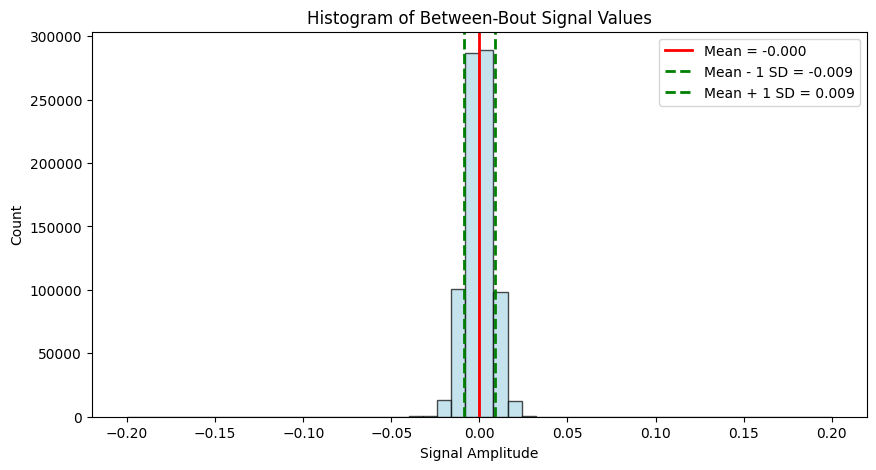

In [40]:
mean_val, std_val = plot_between_bout_histogram(
    abf,
    annotations,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010
)


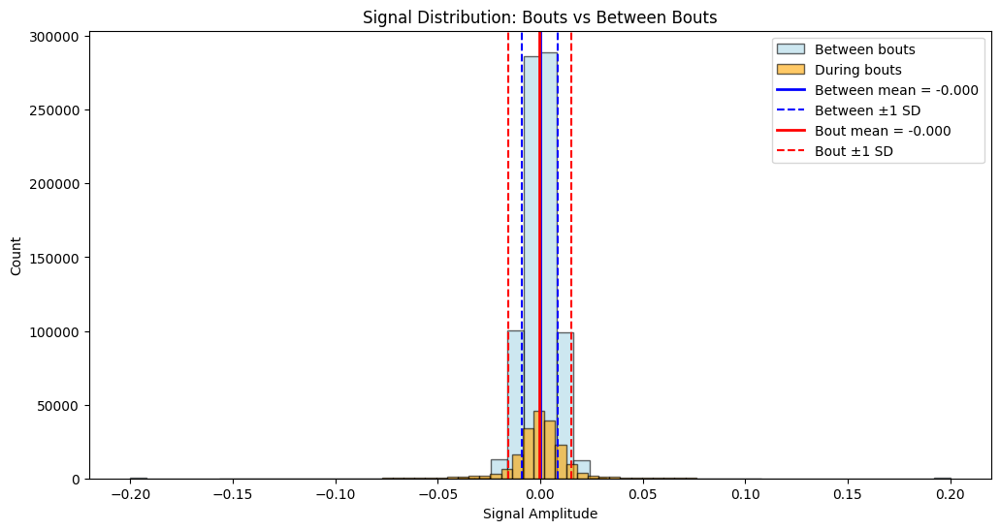

{'bout': {'mean': -0.0002455801877658814, 'std': 0.01551545038819313}, 'between': {'mean': -6.31345683359541e-05, 'std': 0.008753967471420765}}


In [42]:
stats = plot_bout_vs_between_histogram(
    abf,
    annotations,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010
)

print(stats)


In [23]:
abf_names = []
abf_annotations = []
for sheet in sheets.keys():
    print(sheet)
    traces_abfs=sorted(sheets_abfs[sheet]['abfs'].keys())
    abf_names.extend(traces_abfs)
    annotations = sheets_abfs[sheet]["annotations"]
    traces_annotated = sorted(annotations["Trace name"].unique().tolist())
    abf_annotations.extend(traces_annotated) 

2012_08_01_cell1
2012_08_01_cell3
2012_08_07
2012_08_31_cell1
2012_08_31_cell2
2012_08_31_cell3
2012_08_31_cell4
2012_10_04_cell2
2012_12_03_cell1
2012_12_04_cell1
2012_12_05_cell1
2012_12_05_cell3
2012_12_05_cell4
2012_12_06_cell1
2012_12_06_cell4
2013_03_20_cell1
2013_03_21_cell1
2013_03_21_cell3
2013_03_21_cell4
2013_03_21_cell5
2013_03_22_cell1
2013_03_22_cell2
2013_03_22_cell4
2013_03_22_cell5
2013_03_22_cell6


In [45]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_single_bout_abs(
    abf,
    annotations: pd.DataFrame,
    *,
    bout_index: int = 0,        # which bout to plot (0 = first)
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010
):
    """
    Plot one bout segment of the ABF trace as distance from its mean (absolute deviation).
    Negative deviations are flipped positive.
    """
    # Get sweep
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # Find bout windows
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )

    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]

    # Select bout values
    mask = (x >= start) & (x <= end)
    x_bout = x[mask]
    y_bout = y[mask]

    # Center around mean and take absolute distance
    mean_val = np.mean(y_bout)
    y_dev = np.abs(y_bout - mean_val)

    # Plot
    plt.figure(figsize=(12, 4))
    plt.plot(x_bout, y_dev, color="purple", linewidth=0.8)
    plt.title(f"Bout {bout_index} (Absolute Deviation from Mean = 0)")
    plt.xlabel("Time (s)")
    plt.ylabel("Distance from Mean")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

    return x_bout, y_dev, mean_val

In [47]:
import numpy as np
import matplotlib.pyplot as plt

def plot_bout_binned_variance(
    abf,
    annotations,
    *,
    bout_index: int = 0,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    n_bins: int = 50
):
    """
    Plot variance of absolute deviations (distance from mean) in bins across one bout.
    """
    # Get sweep
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # Bout windows
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )
    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]
    mask = (x >= start) & (x <= end)
    x_bout, y_bout = x[mask], y[mask]

    # Absolute deviation from mean
    mean_val = np.mean(y_bout)
    y_dev = np.abs(y_bout - mean_val)

    # Bin edges
    bins = np.linspace(x_bout.min(), x_bout.max(), n_bins + 1)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    variances = []

    for i in range(n_bins):
        in_bin = (x_bout >= bins[i]) & (x_bout < bins[i+1])
        if np.any(in_bin):
            variances.append(np.var(y_dev[in_bin]))
        else:
            variances.append(np.nan)

    # Plot variance vs time bins
    plt.figure(figsize=(12, 4))
    plt.plot(bin_centers, variances, marker="o", linestyle="-", color="darkred")
    plt.title(f"Bout {bout_index}: Variance of Distance from Mean (binned)")
    plt.xlabel("Time (s)")
    plt.ylabel("Variance")
    plt.grid(True, linestyle="--", alpha=0.5)
    plt.show()

    return bin_centers, variances, mean_val


In [55]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

def plot_bout_binned_variance(
    abf,
    annotations: pd.DataFrame,
    *,
    bout_index: int = 0,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    label_col: str | None = None,          # optional: annotate each marker with this column
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    n_bins: int = 50,
    relative_time: bool = False            # if True, x-axis is time relative to bout start
):
    """
    Plot variance of absolute deviations (distance from mean) in bins across one bout,
    and mark where annotations occur inside that bout.

    - Computes bout windows using `start_kw` / `end_kw` (±pad_s).
    - Bins the bout trace along time and computes variance within each bin.
    - Overlays vertical lines for annotations inside the selected bout.
      * Start/end tags can be styled differently.
      * Other tags get a default style.
    """
    # Get sweep data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # ---- Find bout windows (reuses the helper you already have) ----
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )
    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]

    # Mask for the selected bout
    in_bout = (x >= start) & (x <= end)
    x_bout, y_bout = x[in_bout], y[in_bout]

    # Absolute deviation from mean
    mean_val = float(np.mean(y_bout))
    y_dev = np.abs(y_bout - mean_val)

    # Choose x values for plotting (absolute or relative)
    if relative_time:
        x_plot = x_bout - start
        x_left, x_right = 0.0, float((end - start))
    else:
        x_plot = x_bout
        x_left, x_right = float(start), float(end)

    # ---- Bin along time and compute per-bin variance of |y - mean| ----
    bins = np.linspace(x_plot.min(), x_plot.max(), n_bins + 1)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    variances = []
    for i in range(n_bins):
        sel = (x_plot >= bins[i]) & (x_plot < bins[i + 1])
        variances.append(np.var(y_dev[sel]) if np.any(sel) else np.nan)

    # ---- Prepare annotation markers inside this bout ----
    ann_in_bout = annotations[
        (annotations[seconds_col].astype(float) >= start) &
        (annotations[seconds_col].astype(float) <= end)
    ].copy()

    # classification for styling
    def _is_kw(tag, kw): 
        return isinstance(tag, str) and (kw in tag.lower())

    ann_in_bout["_is_start"] = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, start_kw))
    ann_in_bout["_is_end"]   = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, end_kw))

    # x-positions for markers (relative or absolute)
    ann_times = ann_in_bout[seconds_col].astype(float).to_numpy()
    if relative_time:
        ann_times = ann_times - start

    # ---- Plot ----
    plt.figure(figsize=(12, 4))
    plt.plot(bin_centers, variances, marker="o", linestyle="-", color="darkred", label="Variance (binned)")

    # Draw annotation markers
    # Start tags
    starts_mask = ann_in_bout["_is_start"].to_numpy()
    for t in ann_times[starts_mask]:
        plt.axvline(t, linestyle="--", linewidth=1.2, color="tab:green", alpha=0.9)
    # End tags
    ends_mask = ann_in_bout["_is_end"].to_numpy()
    for t in ann_times[ends_mask]:
        plt.axvline(t, linestyle="--", linewidth=1.2, color="tab:red", alpha=0.9)
    # Other tags
    others_mask = ~(starts_mask | ends_mask)
    for t in ann_times[others_mask]:
        plt.axvline(t, linestyle=":", linewidth=1.0, color="tab:blue", alpha=0.9)

    # Optional text labels right above the line
    if label_col and label_col in ann_in_bout.columns:
        y_top = np.nanmax(variances) if np.isfinite(variances).any() else 0.0
        for t, lab in zip(ann_times, ann_in_bout[label_col].astype(str).to_numpy()):
            plt.annotate(lab, xy=(t, y_top), xytext=(0, 6), textcoords="offset points",
                         ha="center", fontsize=8, rotation=0)

    plt.title(f"Bout {bout_index}: Binned variance of |signal − mean| with annotations")
    plt.xlabel("Time (s)" + (" (relative to bout start)" if relative_time else ""))
    plt.ylabel("Variance of |signal − mean|")
    plt.xlim(x_left if relative_time else bin_centers.min(), x_right if relative_time else bin_centers.max())
    # legend entries for lines (create small proxies)
    from matplotlib.lines import Line2D
    legend_lines = [
        Line2D([0], [0], color="darkred", lw=2, label="Binned variance"),
        Line2D([0], [0], color="tab:green", lw=1.2, ls="--", label=start_kw),
        Line2D([0], [0], color="tab:red", lw=1.2, ls="--", label=end_kw),
        Line2D([0], [0], color="gray", lw=1.0, ls=":", label="other annotations"),
    ]
    plt.legend(handles=legend_lines, loc="best")
    # plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

    return {
        "bin_centers": bin_centers,
        "variances": np.array(variances, dtype=float),
        "bout_mean": mean_val,
        "bout_window": (start, end),
        "annotation_times": ann_times,
    }


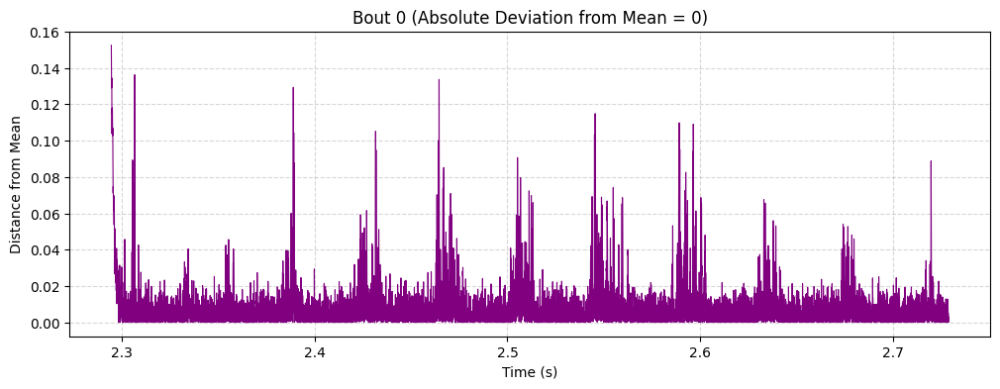

In [46]:
x_bout, y_dev, mean_val = plot_single_bout_abs(
    abf,
    annotations,
    bout_index=0,  # first bout
    channel=1,
    sweep=0,
    pad_s=0.010
)


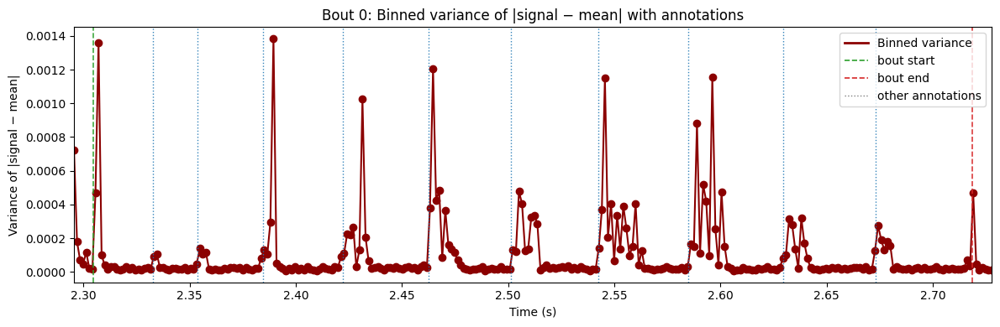

In [59]:
bin_centers, variances, mean_val, bout_window,ann_times = plot_bout_binned_variance(
    abf,
    annotations,
    bout_index=0,   # pick which bout
    channel=1,
    sweep=0,
    n_bins=300       # adjust resolution
)


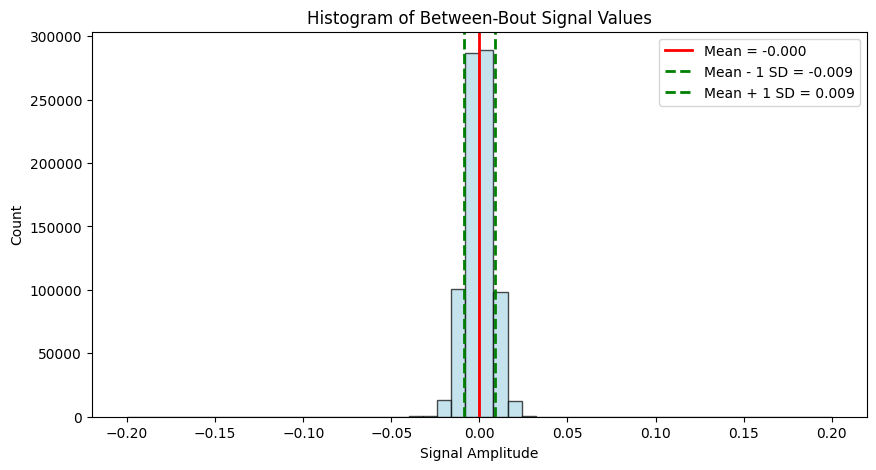

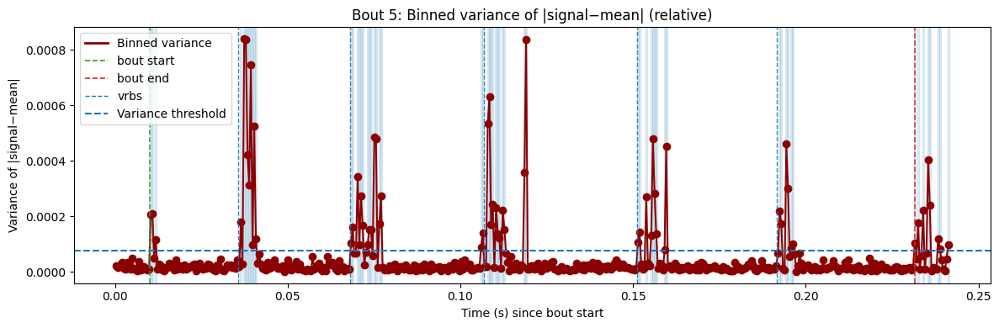

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

def plot_bout_binned_variance_with_threshold(
    abf,
    annotations: pd.DataFrame,
    *,
    bout_index: int = 0,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    label_col: str | None = None,
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    n_bins: int = 50,
    relative_time: bool = False,
    between_std: float | None = None,     # <-- pass your std_val here
    sigma_multiplier: float = 1.0,        # e.g., 1.0, 1.5, 2.0 …
    shade_exceeding: bool = True          # highlight bins above threshold
):
    """
    Plot variance of |signal − mean| in time bins for one bout.
    Overlays annotation markers and a horizontal variance threshold computed from
    between-bout std: var_thresh = (sigma_multiplier * between_std)^2.
    """
    # Get sweep data
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # Bout windows (uses your existing helper)
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )
    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]
    in_bout = (x >= start) & (x <= end)
    x_bout, y_bout = x[in_bout], y[in_bout]

    # Absolute deviation from bout mean
    mean_val = float(np.mean(y_bout))
    y_dev = np.abs(y_bout - mean_val)

    # Time base (absolute vs relative)
    if relative_time:
        x_plot = x_bout - start
    else:
        x_plot = x_bout

    # Bin and compute per-bin variance
    bins = np.linspace(x_plot.min(), x_plot.max(), n_bins + 1)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    variances = []
    for i in range(n_bins):
        sel = (x_plot >= bins[i]) & (x_plot < bins[i + 1])
        variances.append(np.var(y_dev[sel]) if np.any(sel) else np.nan)
    variances = np.array(variances, dtype=float)

    # Prepare annotations within this bout
    ann_in_bout = annotations[
        (annotations[seconds_col].astype(float) >= start) &
        (annotations[seconds_col].astype(float) <= end)
    ].copy()

    def _is_kw(tag, kw): 
        return isinstance(tag, str) and (kw in tag.lower())

    ann_in_bout["_is_start"] = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, start_kw))
    ann_in_bout["_is_end"]   = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, end_kw))

    ann_times = ann_in_bout[seconds_col].astype(float).to_numpy()
    if relative_time:
        ann_times = ann_times - start

    # Compute variance threshold from between-bout std
    var_thresh = None
    if between_std is not None and np.isfinite(between_std):
        var_thresh = float((sigma_multiplier * between_std) ** 2)

    # Plot
    plt.figure(figsize=(12, 4))
    plt.plot(bin_centers, variances, marker="o", linestyle="-", color="darkred", label="Binned variance")

    # Threshold line (+ optional shading where bins exceed it)
    if var_thresh is not None:
        plt.axhline(var_thresh, linestyle="--", linewidth=1.5, color="tab:blue",
                    label=f"Threshold var = ({sigma_multiplier}·STD_between)² = {var_thresh:.3g}")
        if shade_exceeding:
            # shade small rectangles for bins above threshold
            for i, v in enumerate(variances):
                if np.isfinite(v) and v > var_thresh:
                    plt.axvspan(bins[i], bins[i+1], alpha=0.12, color="tab:blue")

    # Annotation markers
    for t in ann_times[ann_in_bout["_is_start"].to_numpy()]:
        plt.axvline(t, linestyle="--", linewidth=1.2, color="tab:green", alpha=0.9)
    for t in ann_times[ann_in_bout["_is_end"].to_numpy()]:
        plt.axvline(t, linestyle="--", linewidth=1.2, color="tab:red", alpha=0.9)
    # other tags
    other_mask = ~(ann_in_bout["_is_start"].to_numpy() | ann_in_bout["_is_end"].to_numpy())
    for t in ann_times[other_mask]:
        plt.axvline(t, linestyle="--", linewidth=1.0, color="tab:blue", alpha=0.9)

    # Optional labels
    if label_col and label_col in ann_in_bout.columns:
        y_top = np.nanmax(variances) if np.isfinite(variances).any() else 0.0
        for t, lab in zip(ann_times, ann_in_bout[label_col].astype(str).to_numpy()):
            plt.annotate(lab, xy=(t, y_top), xytext=(0, 6), textcoords="offset points",
                         ha="center", fontsize=8)

    title_suffix = " (relative)" if relative_time else ""
    plt.title(f"Bout {bout_index}: Binned variance of |signal−mean|{title_suffix}")
    plt.xlabel("Time (s)" + (" since bout start" if relative_time else ""))
    plt.ylabel("Variance of |signal−mean|")
    # Legend
    legend_items = [Line2D([0], [0], color="darkred", lw=2, label="Binned variance"),
                    Line2D([0], [0], color="tab:green", lw=1.2, ls="--", label=start_kw),
                    Line2D([0], [0], color="tab:red",   lw=1.2, ls="--", label=end_kw),
                    Line2D([0], [0], color="tab:blue",      lw=1.0, ls="--",  label="vrbs")]
    if var_thresh is not None:
        legend_items.append(Line2D([0], [0], color="tab:blue", lw=1.5, ls="--", label="Variance threshold"))
    plt.legend(handles=legend_items, loc="best")
    # plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

    return {
        "bin_centers": bin_centers,
        "variances": variances,
        "bout_mean": mean_val,
        "bout_window": (start, end),
        "var_threshold": var_thresh
    }
# First, compute between-bout std from your earlier function:
stats = plot_between_bout_histogram(
    abf,
    annotations,         # filtered to this ABF
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010
)
between_mean, between_std = stats  # mean_val, std_val

# Now plot the binned variance for a bout, with threshold line:
out = plot_bout_binned_variance_with_threshold(
    abf,
    annotations,
    bout_index=5,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010,
    n_bins=500,
    between_std=between_std,   # << pass std_val here
    sigma_multiplier=1,      # try 1.5 or 2.0 if you want a stricter threshold
    relative_time=True         # optional
)


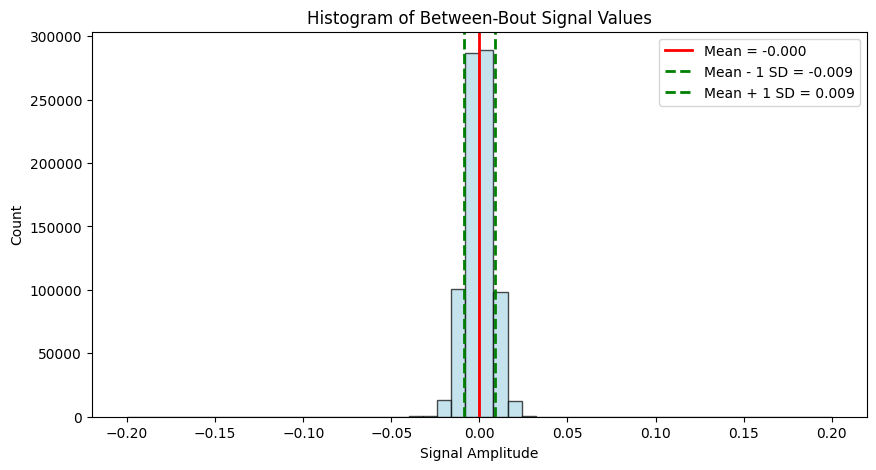

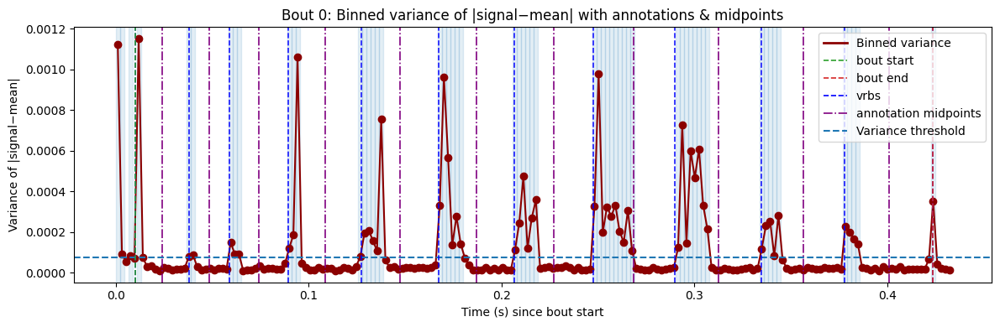

In [76]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

def plot_bout_binned_variance_with_threshold_and_midpoints(
    abf,
    annotations: pd.DataFrame,
    *,
    bout_index: int = 0,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    label_col: str | None = None,
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    n_bins: int = 50,
    relative_time: bool = False,
    between_std: float | None = None,     # pass std_val from between bouts
    sigma_multiplier: float = 1.0,
    shade_exceeding: bool = True
):
    """
    Plot variance of |signal−mean| in time bins for one bout.
    Adds:
      - Variance threshold line (from between-bout std).
      - Annotation markers (start/end/other).
      - Midpoint markers between successive annotations.
    """
    # --- Get sweep data ---
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # --- Bout windows ---
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )
    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]
    in_bout = (x >= start) & (x <= end)
    x_bout, y_bout = x[in_bout], y[in_bout]

    # Absolute deviation
    mean_val = float(np.mean(y_bout))
    y_dev = np.abs(y_bout - mean_val)

    # Time base
    if relative_time:
        x_plot = x_bout - start
    else:
        x_plot = x_bout

    # --- Bin and variance ---
    bins = np.linspace(x_plot.min(), x_plot.max(), n_bins + 1)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    variances = []
    for i in range(n_bins):
        sel = (x_plot >= bins[i]) & (x_plot < bins[i + 1])
        variances.append(np.var(y_dev[sel]) if np.any(sel) else np.nan)
    variances = np.array(variances, dtype=float)

    # --- Annotations inside bout ---
    ann_in_bout = annotations[
        (annotations[seconds_col].astype(float) >= start) &
        (annotations[seconds_col].astype(float) <= end)
    ].copy()

    def _is_kw(tag, kw):
        return isinstance(tag, str) and (kw in tag.lower())

    ann_in_bout["_is_start"] = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, start_kw))
    ann_in_bout["_is_end"]   = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, end_kw))

    ann_times = ann_in_bout[seconds_col].astype(float).to_numpy()
    if relative_time:
        ann_times = ann_times - start
    ann_times = np.sort(ann_times)

    # --- Midpoints between annotations ---
    midpoints = []
    if len(ann_times) >= 2:
        midpoints = 0.5 * (ann_times[:-1] + ann_times[1:])

    # --- Threshold from between bouts ---
    var_thresh = None
    if between_std is not None and np.isfinite(between_std):
        var_thresh = float((sigma_multiplier * between_std) ** 2)

    # --- Plot ---
    plt.figure(figsize=(12, 4))
    plt.plot(bin_centers, variances, marker="o", linestyle="-", color="darkred", label="Binned variance")

    # Threshold line
    if var_thresh is not None:
        plt.axhline(var_thresh, linestyle="--", linewidth=1.5, color="tab:blue",
                    label=f"Threshold var = ({sigma_multiplier}·STD_between)² = {var_thresh:.3g}")
        if shade_exceeding:
            for i, v in enumerate(variances):
                if np.isfinite(v) and v > var_thresh:
                    plt.axvspan(bins[i], bins[i+1], alpha=0.12, color="tab:blue")

    # Annotation markers
    for t in ann_times:
        plt.axvline(t, linestyle="--", color="blue", linewidth=1.2, alpha=0.9)
    for t in ann_times[ann_in_bout["_is_start"].to_numpy()]:
        plt.axvline(t, linestyle="--", color="tab:green", linewidth=1.2)
    for t in ann_times[ann_in_bout["_is_end"].to_numpy()]:
        plt.axvline(t, linestyle="--", color="tab:red", linewidth=1.2)

    # Midpoints
    for t in midpoints:
        plt.axvline(t, linestyle="-.", color="purple", linewidth=1.2, label="Annotation midpoint" if t == midpoints[0] else "")

    # Optional labels
    if label_col and label_col in ann_in_bout.columns:
        y_top = np.nanmax(variances) if np.isfinite(variances).any() else 0.0
        for t, lab in zip(ann_times, ann_in_bout[label_col].astype(str).to_numpy()):
            plt.annotate(lab, xy=(t, y_top), xytext=(0, 6), textcoords="offset points",
                         ha="center", fontsize=8)

    # Formatting
    plt.title(f"Bout {bout_index}: Binned variance of |signal−mean| with annotations & midpoints")
    plt.xlabel("Time (s)" + (" since bout start" if relative_time else ""))
    plt.ylabel("Variance of |signal−mean|")
    legend_items = [
        Line2D([0], [0], color="darkred", lw=2, label="Binned variance"),
        Line2D([0], [0], color="tab:green", lw=1.2, ls="--", label=start_kw),
        Line2D([0], [0], color="tab:red", lw=1.2, ls="--", label=end_kw),
        Line2D([0], [0], color="blue", lw=1.2, ls="--", label="vrbs"),
        Line2D([0], [0], color="purple", lw=1.2, ls="-.", label="annotation midpoints"),
    ]
    if var_thresh is not None:
        legend_items.append(Line2D([0], [0], color="tab:blue", lw=1.5, ls="--", label="Variance threshold"))
    plt.legend(handles=legend_items, loc="best")
    # plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

    return {
        "bin_centers": bin_centers,
        "variances": variances,
        "bout_mean": mean_val,
        "bout_window": (start, end),
        "var_threshold": var_thresh,
        "midpoints": midpoints,
    }
# first compute between-bout stats
between_mean, between_std = plot_between_bout_histogram(
    abf,
    annotations=ann,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010
)

# then call the updated function
out = plot_bout_binned_variance_with_threshold_and_midpoints(
    abf,
    annotations=ann,
    bout_index=0,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010,
    n_bins=200,
    between_std=between_std,
    sigma_multiplier=1.0,
    relative_time=True
)


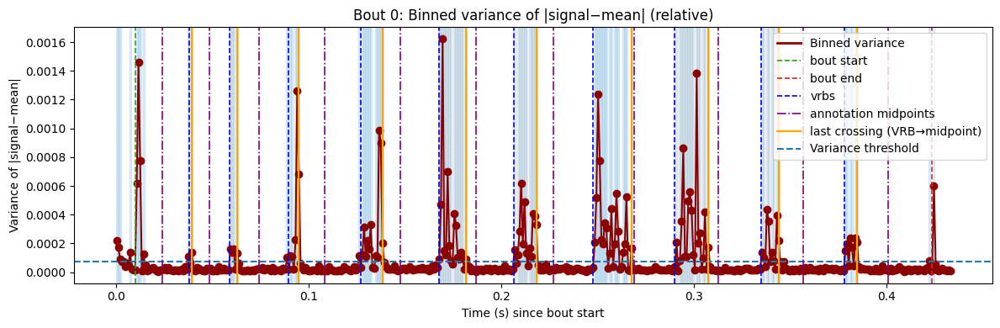

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.lines import Line2D

def plot_bout_binned_variance_with_vrb_lastcross(
    abf,
    annotations: pd.DataFrame,
    *,
    bout_index: int = 0,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    label_col: str | None = None,
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    n_bins: int = 50,
    relative_time: bool = False,
    between_std: float | None = None,   # pass std_val from between-bout histogram
    sigma_multiplier: float = 1.0,
    shade_exceeding: bool = True
):
    """
    Plot binned variance of |signal−mean| for a single bout and annotate:
      - start/end (green/red dashed), VRBs (blue dashed),
      - midpoints between successive annotations (purple dash-dot),
      - variance threshold from between-bout std (blue dashed horizontal),
      - for each VRB→next-midpoint interval, an ORANGE line at the center of the
        last time bin whose variance exceeds the threshold in that interval.
    """
    # --- sweep data ---
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # --- bout windows (requires your earlier _extract_bout_windows helper) ---
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )
    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]
    in_bout = (x >= start) & (x <= end)
    x_bout, y_bout = x[in_bout], y[in_bout]

    # --- absolute deviation from bout mean ---
    mean_val = float(np.mean(y_bout))
    y_dev = np.abs(y_bout - mean_val)

    # --- time axis (absolute vs relative) ---
    if relative_time:
        x_plot = x_bout - start
        t0 = start
    else:
        x_plot = x_bout
        t0 = 0.0  # not used

    # --- binning + variance ---
    bins = np.linspace(x_plot.min(), x_plot.max(), n_bins + 1)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    variances = np.empty(n_bins, dtype=float)
    for i in range(n_bins):
        sel = (x_plot >= bins[i]) & (x_plot < bins[i + 1])
        variances[i] = np.var(y_dev[sel]) if np.any(sel) else np.nan

    # --- annotations inside this bout ---
    ann_in_bout = annotations[
        (annotations[seconds_col].astype(float) >= start) &
        (annotations[seconds_col].astype(float) <= end)
    ].copy()

    def _is_kw(tag, kw):
        return isinstance(tag, str) and (kw in tag.lower())

    ann_in_bout["_is_start"] = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, start_kw))
    ann_in_bout["_is_end"]   = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, end_kw))
    # VRBs := "other annotations" (not start or end)
    ann_in_bout["_is_vrb"]   = ~(ann_in_bout["_is_start"] | ann_in_bout["_is_end"])

    # times (relative if requested)
    ann_times_abs = ann_in_bout[seconds_col].astype(float).to_numpy()
    ann_times = ann_times_abs - start if relative_time else ann_times_abs
    # Sort consistently
    order = np.argsort(ann_times)
    ann_times = ann_times[order]
    is_start = ann_in_bout["_is_start"].to_numpy()[order]
    is_end   = ann_in_bout["_is_end"].to_numpy()[order]
    is_vrb   = ann_in_bout["_is_vrb"].to_numpy()[order]

    # --- midpoints between successive annotations ---
    midpoints = 0.5 * (ann_times[:-1] + ann_times[1:]) if len(ann_times) >= 2 else np.array([], dtype=float)

    # --- threshold from between-bout std ---
    var_thresh = None
    if between_std is not None and np.isfinite(between_std):
        var_thresh = float((sigma_multiplier * between_std) ** 2)

    # --- compute orange markers:
    # For each VRB time t_vrb, find the next midpoint t_mid (> t_vrb).
    # In the interval [t_vrb, t_mid], find the LAST bin where variance > threshold.
    # Place an orange vertical line at that bin's center.
    orange_times = []
    if var_thresh is not None and len(ann_times) > 0 and len(midpoints) > 0:
        # map each VRB to next midpoint
        for t_vrb in ann_times[is_vrb]:
            # find next midpoint strictly after this VRB
            mids_after = midpoints[midpoints > t_vrb]
            if len(mids_after) == 0:
                continue
            t_mid = mids_after[0]

            # find bin indices whose centers lie within [t_vrb, t_mid]
            in_interval = (bin_centers >= t_vrb) & (bin_centers <= t_mid)
            idxs = np.where(in_interval & np.isfinite(variances) & (variances > var_thresh))[0]
            if idxs.size > 0:
                last_idx = idxs[-1]
                orange_times.append(bin_centers[last_idx])

    # --- plot ---
    plt.figure(figsize=(12, 4))
    # binned variance (darkred)
    plt.plot(bin_centers, variances, marker="o", linestyle="-", color="darkred", label="Binned variance")

    # threshold line (blue dashed) + optional shading
    if var_thresh is not None:
        plt.axhline(var_thresh, linestyle="--", linewidth=1.5, color="tab:blue",
                    label=f"Threshold var = ({sigma_multiplier}·STD_between)² = {var_thresh:.3g}")
        if shade_exceeding:
            for i, v in enumerate(variances):
                if np.isfinite(v) and v > var_thresh:
                    plt.axvspan(bins[i], bins[i+1], alpha=0.12, color="tab:blue")

    # annotation markers
    # VRBs (blue dashed)
    for t in ann_times[is_vrb]:
        plt.axvline(t, linestyle="--", color="blue", linewidth=1.2)
    # start (green dashed)
    for t in ann_times[is_start]:
        plt.axvline(t, linestyle="--", color="tab:green", linewidth=1.2)
    # end (red dashed)
    for t in ann_times[is_end]:
        plt.axvline(t, linestyle="--", color="tab:red", linewidth=1.2)

    # midpoints (purple dash-dot)
    for idx, t in enumerate(midpoints):
        plt.axvline(t, linestyle="-.", color="purple", linewidth=1.2)

    # ORANGE markers for "middle of the last bin crossing threshold" per VRB→midpoint interval
    for t in orange_times:
        plt.axvline(t, linestyle="-", color="orange", linewidth=1.6)

    # optional labels on annotations
    if label_col and label_col in ann_in_bout.columns:
        y_top = np.nanmax(variances) if np.isfinite(variances).any() else 0.0
        # use original ordered rows
        for t, lab in zip(ann_times, ann_in_bout[label_col].astype(str).to_numpy()[order]):
            plt.annotate(lab, xy=(t, y_top), xytext=(0, 6), textcoords="offset points",
                         ha="center", fontsize=8)

    # axes + legend
    title_suffix = " (relative)" if relative_time else ""
    plt.title(f"Bout {bout_index}: Binned variance of |signal−mean|{title_suffix}")
    plt.xlabel("Time (s)" + (" since bout start" if relative_time else ""))
    plt.ylabel("Variance of |signal−mean|")

    legend_items = [
        Line2D([0], [0], color="darkred", lw=2, label="Binned variance"),
        Line2D([0], [0], color="tab:green", lw=1.2, ls="--", label=start_kw),
        Line2D([0], [0], color="tab:red",   lw=1.2, ls="--", label=end_kw),
        Line2D([0], [0], color="blue",      lw=1.2, ls="--", label="vrbs"),
        Line2D([0], [0], color="purple",    lw=1.2, ls="-.", label="annotation midpoints"),
        Line2D([0], [0], color="orange",    lw=1.6, ls="-",  label="last crossing (VRB→midpoint)"),
    ]
    if var_thresh is not None:
        legend_items.append(Line2D([0], [0], color="tab:blue", lw=1.5, ls="--", label="Variance threshold"))

    plt.legend(handles=legend_items, loc="best")
    # plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

    return {
        "bin_centers": bin_centers,
        "variances": variances,
        "bout_mean": mean_val,
        "bout_window": (start, end),
        "var_threshold": var_thresh,
        "midpoints": midpoints,
        "vrb_times": ann_times[is_vrb],
        "orange_times": np.array(orange_times),
    }
# between_mean, between_std = plot_between_bout_histogram(...)

out = plot_bout_binned_variance_with_vrb_lastcross(
    abf,
    annotations=ann,         # filtered to this ABF
    bout_index=0,
    channel=1,
    sweep=0,
    seconds_col="Seconds",
    tags_col="Tags",
    pad_s=0.010,
    n_bins=500,
    relative_time=True,
    between_std=between_std,     # from your between-bout histogram
    sigma_multiplier=1.0
)


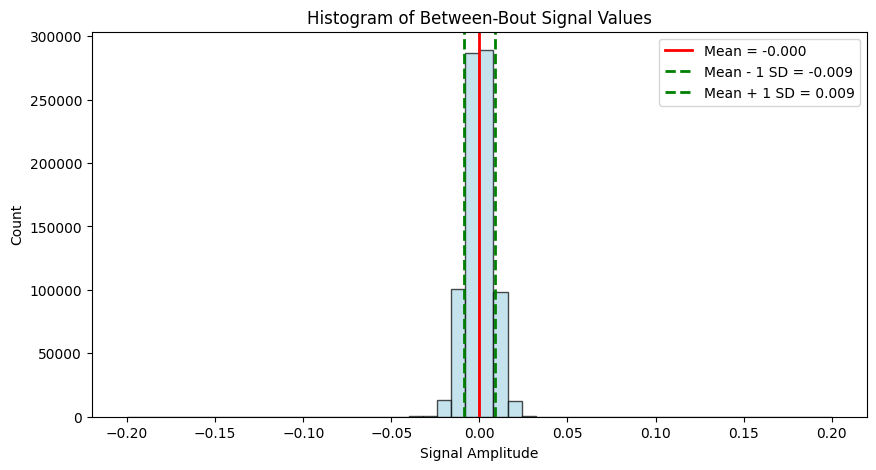

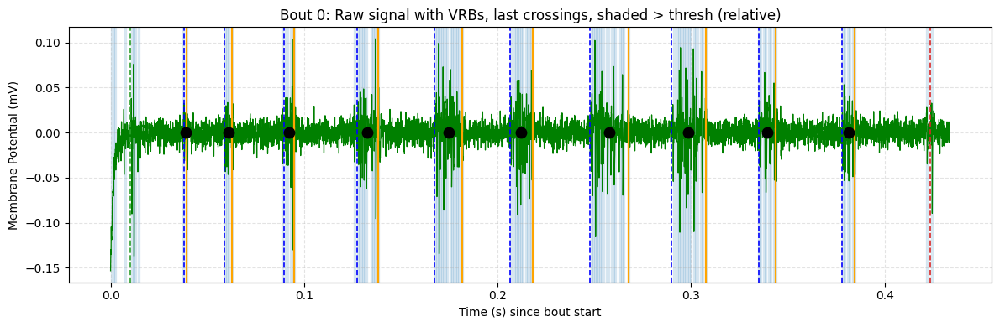

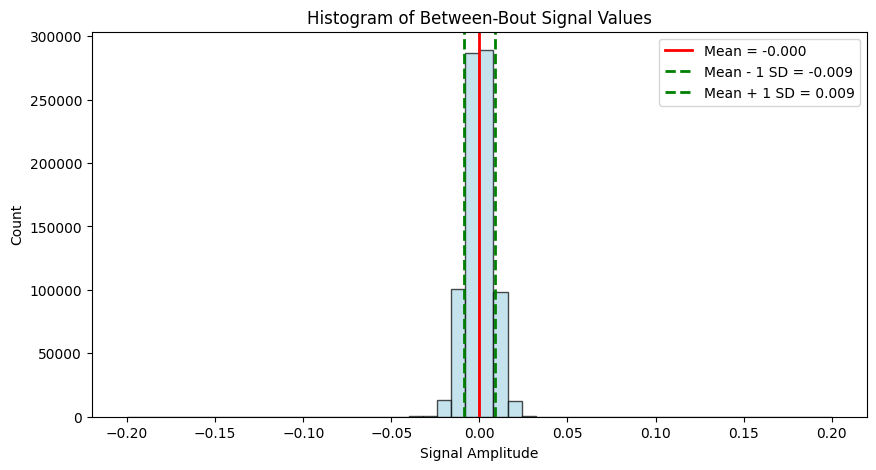

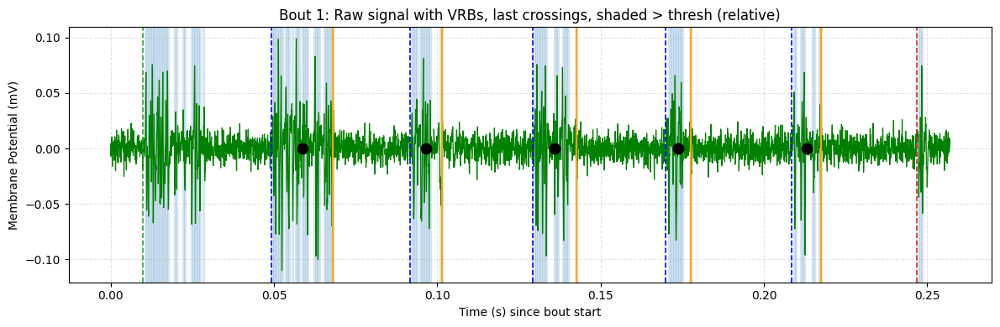

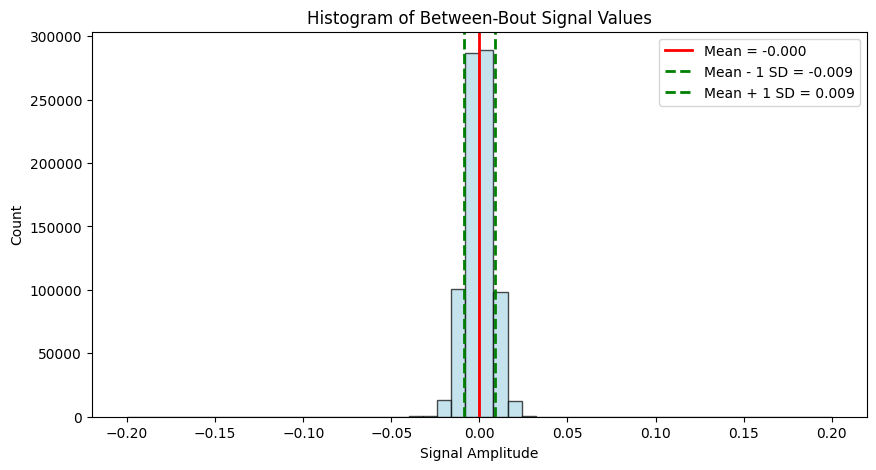

...

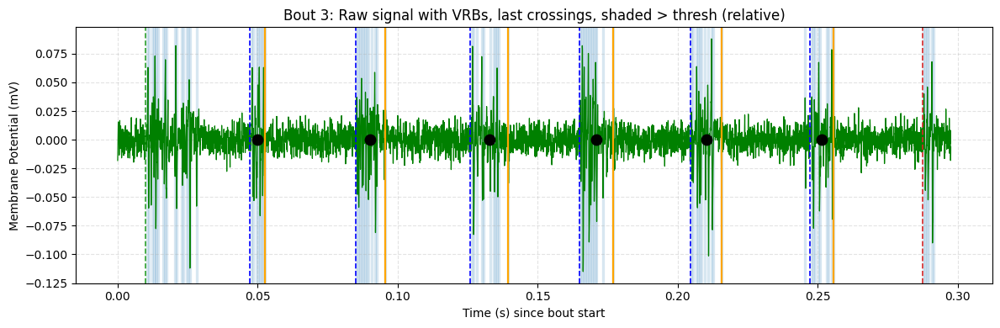

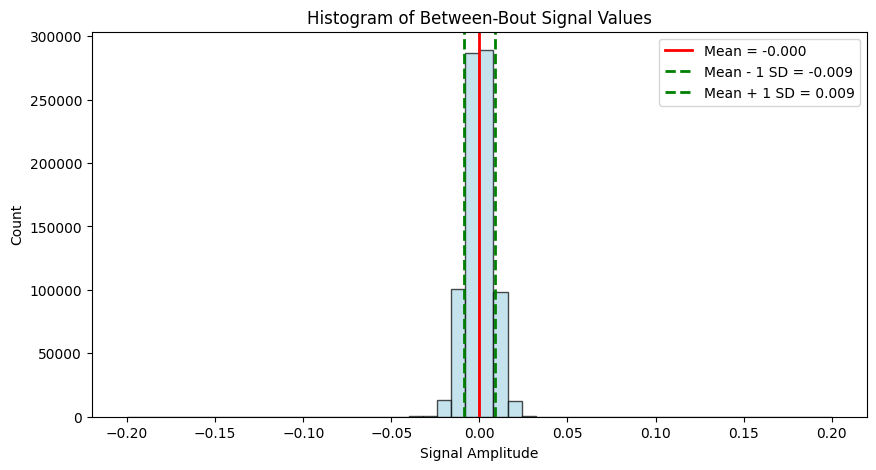

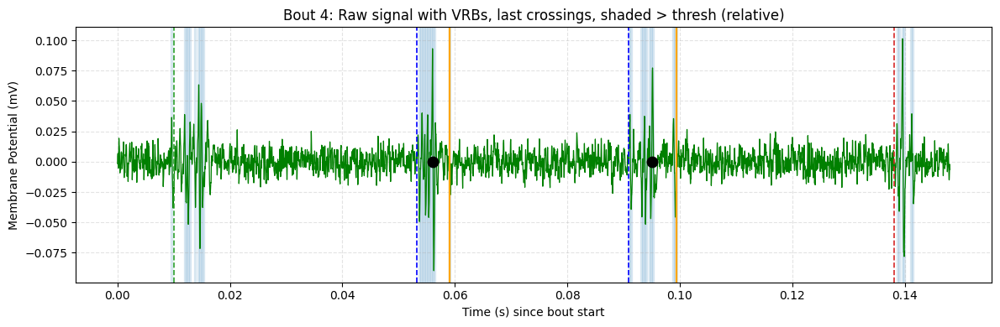

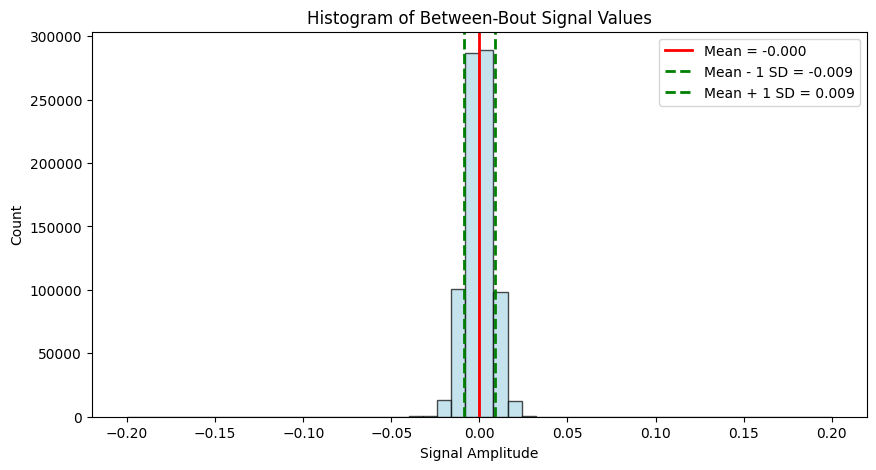

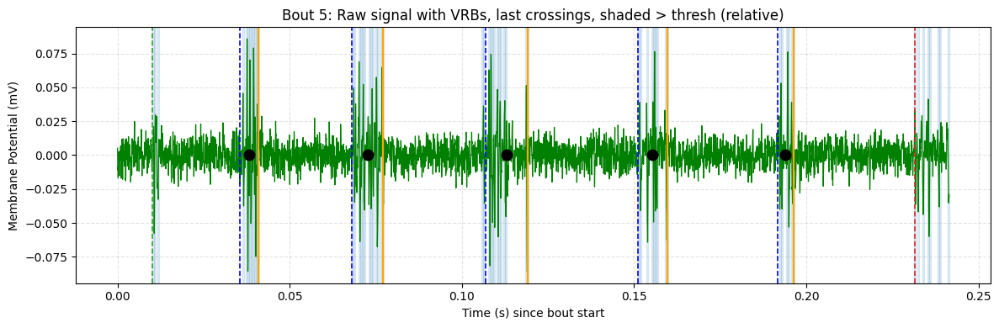

VRB times: [0.0356 0.0681 0.1068 0.1511 0.1916]
Last crossing times: [0.0408 0.077  0.119  0.1596 0.1963]
Black dot times (midpoints): [0.0382 0.0726 0.1129 0.1554 0.194 ]


In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def plot_bout_raw_with_vrb_lastcross_and_midpoint_dots(
    abf,
    annotations: pd.DataFrame,
    *,
    bout_index: int = 0,
    channel: int = 1,
    sweep: int = 0,
    seconds_col: str = "Seconds",
    tags_col: str = "Tags",
    start_kw: str = "bout start",
    end_kw: str = "bout end",
    pad_s: float = 0.010,
    n_bins: int = 500,
    relative_time: bool = False,
    between_std: float | None = None,     # pass std_val from between-bout histogram
    sigma_multiplier: float = 1.0,
    shade_exceeding: bool = True,
    dot_size: float = 60.0                # size of the black midpoint dot
):
    """
    Plot the RAW ABF signal for one bout, with:
      - VRB markers (blue dashed) and start/end markers (green/red dashed),
      - 'last crossing' lines (orange) = last time-bin center above variance threshold
        in the VRB→next-annotation-midpoint interval,
      - shaded regions for bins whose variance (of |signal-mean_bout|) exceeds threshold,
      - a thick BLACK DOT at y=0 at the midpoint between each VRB and its last crossing.

    Note: We still compute bin-wise variance of |signal−mean_bout| internally to determine
    which bins exceed the threshold, but we only *plot* the raw signal (not variance).
    """
    # --- sweep data ---
    abf.setSweep(sweepNumber=sweep, channel=channel)
    x, y = abf.sweepX, abf.sweepY

    # --- bout windows (uses your helper _extract_bout_windows) ---
    windows = _extract_bout_windows(
        annotations,
        seconds_col=seconds_col,
        tags_col=tags_col,
        start_kw=start_kw.lower(),
        end_kw=end_kw.lower(),
        pad_s=pad_s,
    )
    if not windows or bout_index >= len(windows):
        print("⚠️ No bout found with given index.")
        return

    start, end = windows[bout_index]
    in_bout = (x >= start) & (x <= end)
    x_bout, y_bout = x[in_bout], y[in_bout]

    # --- time base (absolute or relative) ---
    if relative_time:
        x_plot = x_bout - start
    else:
        x_plot = x_bout

    # --- compute |signal - mean_bout| for variance bins ---
    mean_bout = float(np.mean(y_bout))
    y_dev = np.abs(y_bout - mean_bout)

    # --- build bins and per-bin variance ---
    bins = np.linspace(x_plot.min(), x_plot.max(), n_bins + 1)
    bin_centers = 0.5 * (bins[:-1] + bins[1:])
    variances = np.empty(n_bins, dtype=float)
    for i in range(n_bins):
        sel = (x_plot >= bins[i]) & (x_plot < bins[i + 1])
        variances[i] = np.var(y_dev[sel]) if np.any(sel) else np.nan

    # --- variance threshold from between-bout std ---
    var_thresh = None
    if between_std is not None and np.isfinite(between_std):
        var_thresh = float((sigma_multiplier * between_std) ** 2)

    # --- annotations inside this bout ---
    ann_in_bout = annotations[
        (annotations[seconds_col].astype(float) >= start) &
        (annotations[seconds_col].astype(float) <= end)
    ].copy()

    def _is_kw(tag, kw):
        return isinstance(tag, str) and (kw in tag.lower())

    ann_in_bout["_is_start"] = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, start_kw))
    ann_in_bout["_is_end"]   = ann_in_bout[tags_col].apply(lambda s: _is_kw(s, end_kw))
    # VRBs: anything not start or end
    ann_in_bout["_is_vrb"]   = ~(ann_in_bout["_is_start"] | ann_in_bout["_is_end"])

    # times (relative if requested) and sort
    ann_times_abs = ann_in_bout[seconds_col].astype(float).to_numpy()
    ann_times = ann_times_abs - start if relative_time else ann_times_abs
    order = np.argsort(ann_times)
    ann_times = ann_times[order]
    is_start = ann_in_bout["_is_start"].to_numpy()[order]
    is_end   = ann_in_bout["_is_end"].to_numpy()[order]
    is_vrb   = ann_in_bout["_is_vrb"].to_numpy()[order]

    # --- compute midpoint BETWEEN SUCCESSIVE ANNOTATIONS (not plotted, but used for intervals) ---
    ann_midpoints = 0.5 * (ann_times[:-1] + ann_times[1:]) if len(ann_times) >= 2 else np.array([], dtype=float)

    # --- for each VRB -> next midpoint, find LAST crossing bin; store its center (orange line)
    orange_times = []
    if var_thresh is not None and len(ann_midpoints) > 0:
        for t_vrb in ann_times[is_vrb]:
            mids_after = ann_midpoints[ann_midpoints > t_vrb]
            if len(mids_after) == 0:
                continue
            t_mid = mids_after[0]
            in_interval = (bin_centers >= t_vrb) & (bin_centers <= t_mid)
            idxs = np.where(in_interval & np.isfinite(variances) & (variances > var_thresh))[0]
            if idxs.size > 0:
                last_idx = idxs[-1]
                orange_times.append(bin_centers[last_idx])

    orange_times = np.array(orange_times, dtype=float)

    # --- black dots at the midpoint between VRB and last crossing (y=0) ---
    black_dot_times = []
    if len(orange_times) > 0:
        # pair each VRB with its chosen last crossing (by order along time)
        vrb_times_ordered = ann_times[is_vrb]
        m = min(len(vrb_times_ordered), len(orange_times))
        for i in range(m):
            t_vrb = vrb_times_ordered[i]
            t_cross = orange_times[i]
            # midpoint in time between VRB and last crossing:
            black_dot_times.append(t_vrb+ (0.5 * (t_cross-t_vrb)))

    # ===================== PLOTTING =====================
    plt.figure(figsize=(12, 4))

    # raw signal
    plt.plot(x_plot, y_bout, linewidth=0.9, color="green", label="Raw signal")

    # shaded bins that exceed threshold (shade by x-range of bins)
    if var_thresh is not None and shade_exceeding:
        for i, v in enumerate(variances):
            if np.isfinite(v) and v > var_thresh:
                plt.axvspan(bins[i], bins[i+1], alpha=0.12, color="tab:blue")

    # VRBs (blue dashed)
    for t in ann_times[is_vrb]:
        plt.axvline(t, linestyle="--", color="blue", linewidth=1.2)
    # start (green dashed)
    for t in ann_times[is_start]:
        plt.axvline(t, linestyle="--", color="tab:green", linewidth=1.2)
    # end (red dashed)
    for t in ann_times[is_end]:
        plt.axvline(t, linestyle="--", color="tab:red", linewidth=1.2)

    # last crossings (orange solid)
    for t in orange_times:
        plt.axvline(t, linestyle="-", color="orange", linewidth=1.6)

    # thick black dots at y=0 for midpoint between VRB and last crossing
    if len(black_dot_times) > 0:
        plt.scatter(black_dot_times, np.zeros(len(black_dot_times)),
                    s=dot_size, color="black", zorder=5)

    # labels/format
    title_suffix = " (relative)" if relative_time else ""
    plt.title(f"Bout {bout_index}: Raw signal with VRBs, last crossings, shaded > thresh{title_suffix}")
    plt.xlabel("Time (s)" + (" since bout start" if relative_time else ""))
    plt.ylabel(abf.sweepLabelY)

    # legend_items = [
    #     Line2D([0], [0], color="green",    lw=1.5, label="Raw signal"),
    #     Line2D([0], [0], color="tab:green", lw=1.2, ls="--", label=start_kw),
    #     Line2D([0], [0], color="tab:red",   lw=1.2, ls="--", label=end_kw),
    #     Line2D([0], [0], color="blue",      lw=1.2, ls="--", label="vrbs"),
    #     Line2D([0], [0], color="orange",    lw=1.6, ls="-",  label="last crossing (VRB→midpoint)"),
    #     Line2D([0], [0], marker="o", color="black", lw=0, markersize=8, label="midpoint(VRB, last crossing) @ y=0"),
    # ]
    # if var_thresh is not None:
    #     legend_items.append(Line2D([0], [0], color="tab:blue", lw=8, alpha=0.12, label="bins above variance threshold (shaded)"))

    # plt.legend(handles=legend_items, loc="best")
    plt.grid(True, linestyle="--", alpha=0.35)
    plt.tight_layout()
    plt.show()

    return {
        "bout_window": (start, end),
        "mean_bout": mean_bout,
        "bin_edges": bins,
        "bin_centers": bin_centers,
        "variances": variances,
        "var_threshold": var_thresh,
        "vrb_times": ann_times[is_vrb],
        "last_cross_times": orange_times,
        "midpoint_dot_times": np.array(black_dot_times, dtype=float),
    }

for bout in range(6):
    # 1. First, compute between-bout stats (mean/std) from the histogram function:
    between_mean, between_std = plot_between_bout_histogram(
        abf,
        annotations=ann,         # filtered annotations for this ABF only
        channel=1,
        sweep=0,
        seconds_col="Seconds",
        tags_col="Tags",
        pad_s=0.010
    )

    # 2. Now, plot one bout using the updated raw-signal plotting function:
    out = plot_bout_raw_with_vrb_lastcross_and_midpoint_dots(
        abf,
        annotations=ann,
        bout_index=bout,            # index of the bout to plot (0 = first)
        channel=1,
        sweep=0,
        seconds_col="Seconds",
        tags_col="Tags",
        pad_s=0.010,
        n_bins=500,               # how finely to bin time for variance check
        relative_time=True,      # x-axis relative to bout start
        between_std=between_std, # <-- pass the between-bout std here
        sigma_multiplier=1.0,    # threshold = (1 * between_std)^2
        dot_size=80              # adjust size of black midpoint dot
    )

# 3. Access outputs if needed:
print("VRB times:", out["vrb_times"])
print("Last crossing times:", out["last_cross_times"])
print("Black dot times (midpoints):", out["midpoint_dot_times"])


To check if sweeps are concatanated correctly:

In [ ]:

def make_waveforms(abf, df):
    '''
    Function that takes an abf file and a df of the annotations
    Returns a dictionary with waveforms labeled by their frequency, cell type, signal type, and rin
    '''

    # Build full trace across all sweeps
    full_time = []
    full_current = []
    for sweep in range(abf.sweepCount):
        abf.setSweep(sweepNumber=sweep, channel=0)
        sweep_time = abf.sweepX + sweep * abf.sweepLengthSec
        sweep_current = abf.sweepY
        full_time.append(sweep_time)
        full_current.append(sweep_current)

    # Flatten lists
    full_time = np.concatenate(full_time)
    full_current = np.concatenate(full_current)
    # Make dataframe 
    abf_df = pd.DataFrame({
        'Time': full_time,
        'Current': full_current
    })

    if "Seconds" not in df.columns:
        df["Seconds"] = pd.to_numeric(df["On time"], errors="coerce") * 0.001

    waveforms = {}
    for i in range(len(df) - 1):
        t_0 = df.iloc[i]["Seconds"]
        t_f = df.iloc[i + 1]["Seconds"]

        abf_waveform = abf_df[(abf_df["Time"] >= t_0) & (abf_df["Time"] <= t_f)].copy()
        # previous error
        if abf_waveform.empty:
            raise ValueError(
                f"abf_waveform is empty for index {i}, t_0={t_0}, t_f={t_f}, Trace name={df.iloc[i]['Trace name']}"
            )
            
        # Optional: Remove outliers (IQR method)
        # Q1 = abf_waveform["Current"].quantile(0.25)
        # Q3 = abf_waveform["Current"].quantile(0.75)
        # IQR = Q3 - Q1
        # lower = Q1 - iqr_multiplier * IQR
        # upper = Q3 + iqr_multiplier * IQR
        # abf_waveform = abf_waveform[(abf_waveform["Current"] >= lower) & (abf_waveform["Current"] <= upper)]

        # if abf_waveform.empty:
        #     continue  


        # Add phase (0 to 1 across the segment)
        abf_waveform["Phase"] = (abf_waveform["Time"] - t_0) / (t_f - t_0)

        # Normalize Current
        y_max = abf_waveform["Current"].max()
        y_min = abf_waveform["Current"].min()
        abf_waveform["Normalized Current"] = (abf_waveform["Current"] - y_min) / (y_max - y_min)

        # Dict keys
        freq = 1 / (t_f - t_0)
        signal_type = df.iloc[i]["Type"]
        median = df.iloc[i]["Median Spiking"]
        mean = df.iloc[i]["Mean Spiking"]
        key = (freq, signal_type, median, mean)

        waveforms[key] = abf_waveform

    return waveforms

def sheets_to_waveforms(sheets):
    all_waveforms = {}
    for sheet in sheets_types: # using sheet_types instead of sheet_keys() since not all sheets are labeled
        # print(sheet)
        traces_df_mkwf = sheets[sheet]["annotations"]
        # print(traces_df_mkwf)
        abfs_mkwv = sheets[sheet]["abfs"]
        # print(abfs_mkwv)
        traces_df_mkwf = traces_df_mkwf[traces_df_mkwf["Type"] != "Cell-attached (spiking)"]
        traces = traces_df_mkwf["Trace name"].unique().tolist()
        # print(traces)
        for trace in abfs_mkwv.keys():

            abf_mkwv = abfs_mkwv[trace]
            # print(abf_mkwv)
            df_mkwv = traces_df_mkwf[traces_df_mkwf["Trace name"]==trace]
            # print(df_mkwv)

            waveforms = make_waveforms(abf_mkwv,df_mkwv)

            for key, value in waveforms.items():
                # combined_key = f"{sheet}_{trace}_{key}"  
                all_waveforms[key] = value
        
    return all_waveforms

: 

In [ ]:
all_waveforms = sheets_to_waveforms(sheets_abfs)

In [ ]:
all_waveforms

{(np.float64(35.59985760056938),
  'Inhibitory',
  np.float64(24.52),
  np.float64(24.97)):            Time     Current         Phase  Normalized Current
 230481  2.30481  221.923813  1.580951e-14            0.024819
 230482  2.30482  223.999008  3.559986e-04            0.026555
 230483  2.30483  229.248032  7.119972e-04            0.030947
 230484  2.30484  233.032211  1.067996e-03            0.034113
 230485  2.30485  232.666000  1.423994e-03            0.033807
 ...         ...         ...           ...                 ...
 233286  2.33286  614.990173  9.985760e-01            0.353692
 233287  2.33287  615.112244  9.989320e-01            0.353794
 233288  2.33288  615.844666  9.992880e-01            0.354407
 233289  2.33289  616.577087  9.996440e-01            0.355020
 233290  2.33290  617.309509  1.000000e+00            0.355633
 
 [2810 rows x 4 columns],
 (np.float64(47.86979415988494),
  'Inhibitory',
  np.float64(24.52),
  np.float64(24.97)):            Time     Current     P

In [ ]:
x

Using Counter to count how many waveform trpes

In [ ]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif freq >= 45:
        return "45+"
    else:
        return None

def get_speed_bin(value, cutoff=35):
    return "fast" if value > cutoff else "slow"

def normalize_signal_type(s: str) -> str:
    s_low = s.strip().lower()
    if s_low.startswith("excitatory"):
        return "Excitatory"
    if s_low.startswith("inhibitory"):
        return "Inhibitory"
    if "cell-attached" in s_low:
        return None
    return s  

key_counts = Counter()
for freq, signal_type, median, mean in all_waveforms.keys():
    norm_type = normalize_signal_type(signal_type)
    freq_bin = get_freq_bin(freq)
    if norm_type is None:  # skip unwanted signals
        continue
    if freq_bin is None:  # skip unwanted signals
        continue
    grouped_key = (
        freq_bin,
        norm_type,
        get_speed_bin(median)   # or mean
    )
    key_counts[grouped_key] += 1



In [ ]:
key_counts

Counter({('25–35', 'Excitatory', 'fast'): 3340,
         ('25–35', 'Excitatory', 'slow'): 3071,
         ('25–35', 'Inhibitory', 'slow'): 2314,
         ('25–35', 'Inhibitory', 'fast'): 1883,
         ('15–25', 'Excitatory', 'fast'): 1044,
         ('15–25', 'Excitatory', 'slow'): 888,
         ('35–45', 'Excitatory', 'fast'): 713,
         ('35–45', 'Excitatory', 'slow'): 513,
         ('15–25', 'Inhibitory', 'fast'): 401,
         ('35–45', 'Inhibitory', 'slow'): 364,
         ('35–45', 'Inhibitory', 'fast'): 358,
         ('45+', 'Excitatory', 'fast'): 296,
         ('45+', 'Inhibitory', 'fast'): 193,
         ('15–25', 'Inhibitory', 'slow'): 192,
         ('45+', 'Excitatory', 'slow'): 167,
         ('45+', 'Inhibitory', 'slow'): 110})

bin `all_waveforms` and store in `binned_waveforms`

In [ ]:
binned_waveforms = {}
for wave in all_waveforms.keys():
    binned = bin_wave_100(all_waveforms[wave])
    binned_waveforms[wave] = binned

Save binned waveforms dict using pickle

In [ ]:
binned_waveforms

{(np.float64(35.59985760056938),
  'Inhibitory',
  np.float64(24.52),
  np.float64(24.97)):          Phase Bin      Current  Normalized Current   Phase
 0   (-0.001, 0.02]   228.151535            0.030029  0.0095
 1     (0.02, 0.04]   224.127609            0.026663  0.0300
 2     (0.04, 0.06]   219.611008            0.022884  0.0500
 3     (0.06, 0.08]   203.532608            0.009431  0.0700
 4      (0.08, 0.1]   291.560577            0.083083  0.0900
 5      (0.1, 0.12]   370.429810            0.149072  0.1100
 6     (0.12, 0.14]   370.060486            0.148763  0.1300
 7     (0.14, 0.16]   353.253998            0.134701  0.1500
 8     (0.16, 0.18]   338.701477            0.122525  0.1700
 9      (0.18, 0.2]   324.617645            0.110741  0.1900
 10     (0.2, 0.22]   309.718506            0.098275  0.2100
 11    (0.22, 0.24]   294.015961            0.085137  0.2300
 12    (0.24, 0.26]   283.512634            0.076349  0.2500
 13    (0.26, 0.28]   272.229828            0.066909  0

In [ ]:
# import pickle
# # Save it to a file
# with open("binned_spikekeys.pkl", "wb") as f:
#     pickle.dump(binned_waveforms, f)



NEXT: access keys to average across the key types and plot
- current type: excitatory, inhibitory, cell-attached
- frequency bins: 15-25,25-35,35-45,45+
- speed preference: fast, slow

function(current,freq,rin,type) -> plot waveform

In [ ]:
binned_waveforms.keys()

dict_keys([(np.float64(35.59985760056938), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(47.86979415988494), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(32.690421706439885), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(26.497085320614815), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(24.826216484607688), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(25.720164609053334), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(24.295432458697977), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(23.65744026496319), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(22.21235006663724), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(23.15886984715146), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(21.95389681668497), 'Inhibitory', np.float64(24.52), np.float64(24.97)), (np.float64(1.1729930089616663), 'Inhibitory', np

In [ ]:
def average_waveforms_for_key_median(counter_key):
    """
    Takes a counter key like ('25–35', 'Excitatory', 'fast')
    Returns a DataFrame of the averaged waveform over 'Phase Bin' for that key.
    """
    # unpack new 3-part key
    freq_bin, norm_signal_type, fast_slow = counter_key

    dfs = []  # collect matching waveform DataFrames

    # binned_waveforms keys assumed to be (freq, signal_type, cell_type, fast_slow)
    for key in binned_waveforms.keys():
        freq, raw_signal_type, median, mean = key

        # normalize / filter signal type
        norm_st = normalize_signal_type(raw_signal_type)
        if norm_st is None:         # skip cell-attached
            continue

        # match against the new grouped key
        if get_freq_bin(freq) == freq_bin and norm_st == norm_signal_type and get_speed_bin(median, cutoff=35) == fast_slow:
            dfs.append(binned_waveforms[key].copy())

    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None

    combined = pd.concat(dfs, ignore_index=True)
    averaged = combined.groupby('Phase', observed=False).mean(numeric_only=True).reset_index()
    return averaged


In [ ]:
def make_avg_waveform_dict(
    key_counts,
    averaging_func=average_waveforms_for_key_median,
    invert_excitatory=False,
    value_col="Normalized Current",
    drop_empty=True
):
    """
    Build {counter_key -> averaged DataFrame} for all keys in key_counts.

    Parameters
    ----------
    key_counts : Counter
        Keys are (freq_bin, signal_type, fast_slow).
    averaging_func : callable
        Function that takes a counter_key and returns an averaged DataFrame
        (e.g., average_waveforms_for_key_median).
    invert_excitatory : bool
        If True, multiply 'value_col' by -1 for Excitatory keys.
    value_col : str
        Column to invert if invert_excitatory=True (e.g., 'Normalized Current' or 'Current').
    drop_empty : bool
        If True, skip keys whose averaged DataFrame is None/empty.

    Returns
    -------
    dict
        {counter_key: averaged_dataframe}
    """
    avg_dict = {}
    for counter_key in key_counts.keys():
        df = averaging_func(counter_key)
        if df is None or df.empty:
            if not drop_empty:
                avg_dict[counter_key] = df
            continue

        # Optional inversion for excitatory
        _, signal_type, _ = counter_key
        if invert_excitatory and signal_type == "Excitatory" and value_col in df.columns:
            df = df.copy()
            df[value_col] = -df[value_col]

        avg_dict[counter_key] = df

    return avg_dict

avg_by_key = make_avg_waveform_dict(
    key_counts,
    averaging_func=average_waveforms_for_key_median,
    invert_excitatory=False,              # set True if you want E inverted
    value_col="Normalized Current"
)
avg_by_key

avg_by_key2 = make_avg_waveform_dict(
    key_counts,
    averaging_func=average_waveforms_for_key_median,
    invert_excitatory=True,              # set True if you want E inverted
    value_col="Normalized Current"
)
avg_by_key2

with open("normalized_currents.pkl", "wb") as f:
    pickle.dump(avg_by_key, f)

with open("normalized_currents_invertE.pkl", "wb") as f:
    pickle.dump(avg_by_key2, f)


In [ ]:
import pandas as pd

def combine_avg_waveforms(avg_dict):
    """
    Combine dictionary of averaged waveforms into one long DataFrame,
    adding columns for freq_bin, signal_type, and fast_slow.

    Parameters
    ----------
    avg_dict : dict
        { (freq_bin, signal_type, fast_slow): averaged_dataframe }

    Returns
    -------
    DataFrame
        Combined DataFrame with extra columns for the key.
    """
    dfs = []
    for (freq_bin, signal_type, fast_slow), df in avg_dict.items():
        if df is None or df.empty:
            continue
        df_copy = df.copy()
        df_copy["Freq Bin"] = freq_bin
        df_copy["Signal Type"] = signal_type
        df_copy["Speed"] = fast_slow
        dfs.append(df_copy)

    if not dfs:
        print("No data to combine.")
        return pd.DataFrame()

    combined = pd.concat(dfs, ignore_index=True)
    return combined
avg_by_key = make_avg_waveform_dict(key_counts, averaging_func=average_waveforms_for_key_median)
big_df = combine_avg_waveforms(avg_by_key)

print(big_df.head())


    Phase     Current  Normalized Current Freq Bin Signal Type Speed
0  0.0095  313.779541            0.277705    35–45  Inhibitory  slow
1  0.0300  323.982880            0.304697    35–45  Inhibitory  slow
2  0.0500  337.557465            0.343519    35–45  Inhibitory  slow
3  0.0700  350.979645            0.385777    35–45  Inhibitory  slow
4  0.0900  358.382416            0.406148    35–45  Inhibitory  slow


In [ ]:
def average_waveforms_for_key_invert(counter_key):
    """
    Like average_waveforms_for_key, but optionally inverts excitatory signals.
    
    Parameters
    ----------
    counter_key : tuple
        (freq_bin, signal_type, fast_slow)
    invert_excitatory : bool
        If True, flip the sign of excitatory signals.
    value_col : str
        Column to invert (e.g., 'Normalized Current' or 'Current').
    
    Returns
    -------
    DataFrame or None
        Averaged waveform with optional inversion.
    """
    invert_excitatory=True 
    value_col="Normalized Current"
    averaged = average_waveforms_for_key_median(counter_key)
    if averaged is None:
        return None
    
    freq_bin, signal_type, fast_slow = counter_key
    if invert_excitatory and signal_type == "Excitatory":
        if value_col in averaged.columns:
            averaged[value_col] = 1-averaged[value_col]
    return averaged
avg_by_key2 = make_avg_waveform_dict(key_counts, averaging_func=average_waveforms_for_key_invert)
big_df2 = combine_avg_waveforms(avg_by_key2)


In [ ]:
print(big_df2.head())
big_df.to_csv("normalized_currents.csv", index=False)
big_df2.to_csv("normalized_currents_invertE.csv", index=False)

    Phase     Current  Normalized Current Freq Bin Signal Type Speed
0  0.0095  313.779541            0.277705    35–45  Inhibitory  slow
1  0.0300  323.982880            0.304697    35–45  Inhibitory  slow
2  0.0500  337.557465            0.343519    35–45  Inhibitory  slow
3  0.0700  350.979645            0.385777    35–45  Inhibitory  slow
4  0.0900  358.382416            0.406148    35–45  Inhibitory  slow


In [ ]:
# Use a key from Counter
example_key = ('25–35', 'Excitatory', 'fast')

avg_waveform_df = average_waveforms_for_key_median(example_key)
avg_waveform_df


,Phase,Current,Normalized Current
0,0.0095,-80.798279,0.573311
1,0.0300,-82.277695,0.552591
2,0.0500,-83.517365,0.531178
3,0.0700,-84.430099,0.512137
4,0.0900,-85.333496,0.494909
5,0.1100,-85.975487,0.478160
6,0.1300,-86.647545,0.464501
7,0.1500,-86.811516,0.452722
8,0.1700,-86.911179,0.445545
9,0.1900,-87.001236,0.440994


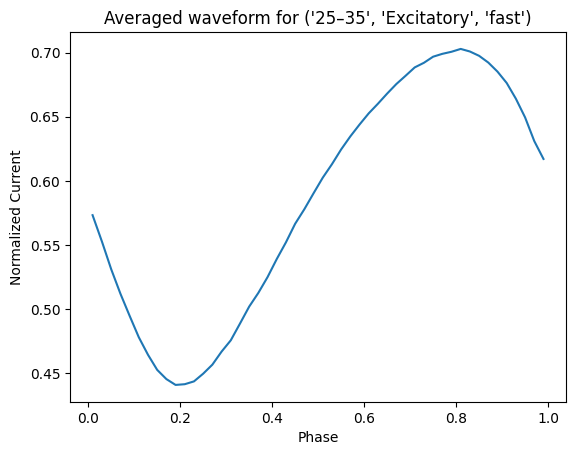

In [ ]:
if avg_waveform_df is not None:
    plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'])
    plt.xlabel('Phase')
    plt.ylabel('Normalized Current')
    plt.title(f'Averaged waveform for {example_key}')
    plt.show()


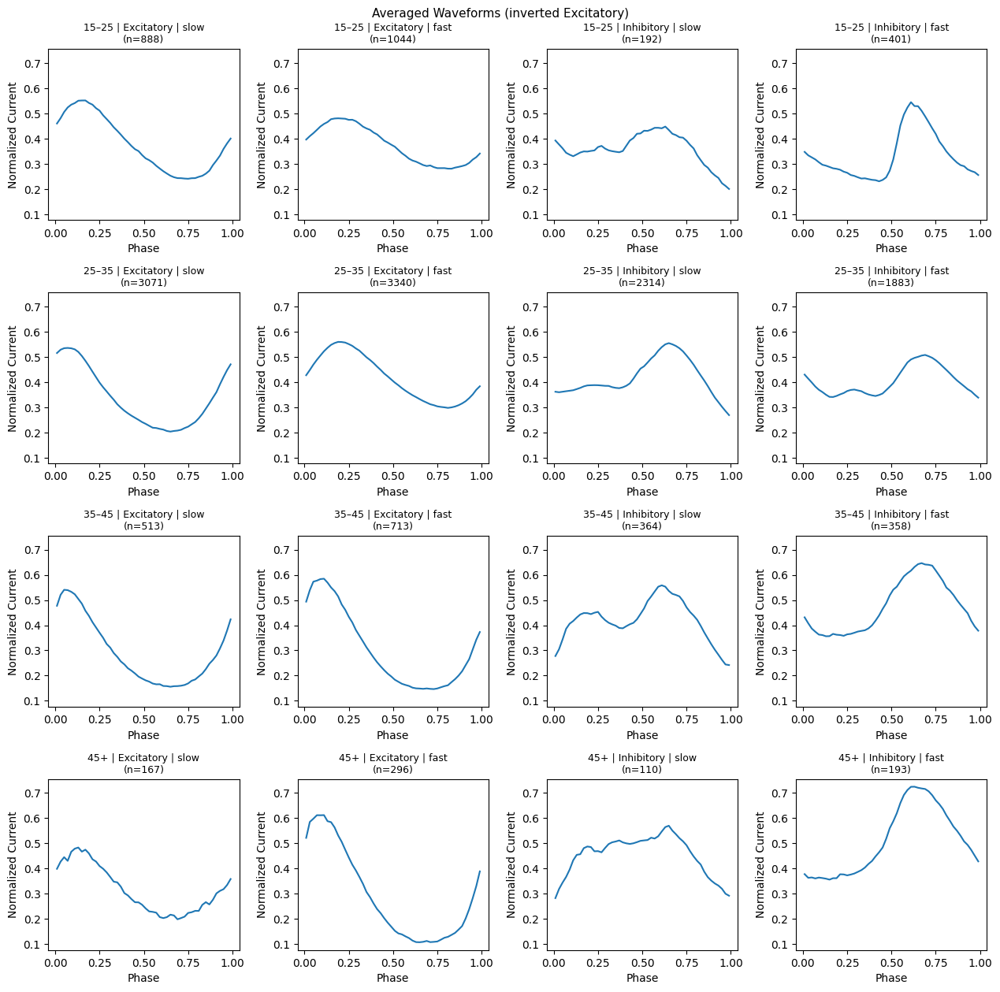

In [ ]:
def average_waveforms_for_key_invert(counter_key):
    """
    Like average_waveforms_for_key, but optionally inverts excitatory signals.
    
    Parameters
    ----------
    counter_key : tuple
        (freq_bin, signal_type, fast_slow)
    invert_excitatory : bool
        If True, flip the sign of excitatory signals.
    value_col : str
        Column to invert (e.g., 'Normalized Current' or 'Current').
    
    Returns
    -------
    DataFrame or None
        Averaged waveform with optional inversion.
    """
    invert_excitatory=True 
    value_col="Normalized Current"
    averaged = average_waveforms_for_key_median(counter_key)
    if averaged is None:
        return None
    
    freq_bin, signal_type, fast_slow = counter_key
    if invert_excitatory and signal_type == "Excitatory":
        if value_col in averaged.columns:
            averaged[value_col] = 1-averaged[value_col]
    return averaged


def plot_counter_grid(
    key_counts,
    value_col="Normalized Current",   # or "Current"
    ncols=5,
    linewidth=1.5,
    sharey=True,
    figsize_per_row=3.2,
    title_fontsize=9,
    suptitle=None
):
    """
    Plot averaged waveforms for every key in `key_counts` (a Counter whose keys are
    (freq_bin, signal_type, fast_slow)) in a grid of subplots.

    Requires a function `average_waveforms_for_key(counter_key)` in scope that returns
    a DataFrame with columns ['Phase', value_col] for the provided key.
    """
    # Sort keys in a consistent, readable order
    freq_order = ["<15", "15–25", "25–35", "35–45", "45+"]
    signal_order = ["Excitatory", "Inhibitory"]
    speed_order = ["slow", "fast"]

    def sort_key(k):
        fb, st, sp = k
        return (
            freq_order.index(fb) if fb in freq_order else len(freq_order),
            signal_order.index(st) if st in signal_order else len(signal_order),
            speed_order.index(sp) if sp in speed_order else len(speed_order),
        )

    keys = sorted(key_counts.keys(), key=sort_key)
    n = len(keys)
    if n == 0:
        print("No keys to plot.")
        return

    # Preload data and compute global y-limits for consistent scaling (optional)
    per_key_data = []
    ymins, ymaxs = [], []
    for k in keys:
        df = average_waveforms_for_key_invert(k)
        per_key_data.append(df)
        if df is not None and value_col in df:
            vals = df[value_col].to_numpy()
            if np.isfinite(vals).any():
                ymins.append(np.nanmin(vals))
                ymaxs.append(np.nanmax(vals))

    global_ylim = None
    if sharey and ymins and ymaxs:
        ypad = 0.05 * (np.nanmax(ymaxs) - np.nanmin(ymins) + 1e-12)
        global_ylim = (np.nanmin(ymins) - ypad, np.nanmax(ymaxs) + ypad)

    # Figure layout
    nrows = math.ceil(n / ncols)
    figsize = (ncols * figsize_per_row, nrows * figsize_per_row)
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, squeeze=False)
    axes = axes.ravel()

    # Plot each key
    for ax, k, df in zip(axes, keys, per_key_data):
        fb, st, sp = k
        count = key_counts[k]
        if df is None or df.empty or "Phase" not in df or value_col not in df:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.set_axis_off()
            continue

        ax.plot(df["Phase"], df[value_col], linewidth=linewidth)
        ax.set_title(f"{fb} | {st} | {sp}\n(n={count})", fontsize=title_fontsize)
        ax.set_xlabel("Phase")
        ax.set_ylabel(value_col)

        if global_ylim is not None:
            ax.set_ylim(global_ylim)

    # Turn off any leftover empty axes (if n doesn't fill the grid)
    for j in range(len(per_key_data), len(axes)):
        axes[j].set_axis_off()

    if suptitle:
        fig.suptitle(suptitle, fontsize=title_fontsize + 2, y=0.98)

    fig.tight_layout()
    plt.show()
plot_counter_grid(key_counts, value_col="Normalized Current", ncols=4, suptitle="Averaged Waveforms (inverted Excitatory)")


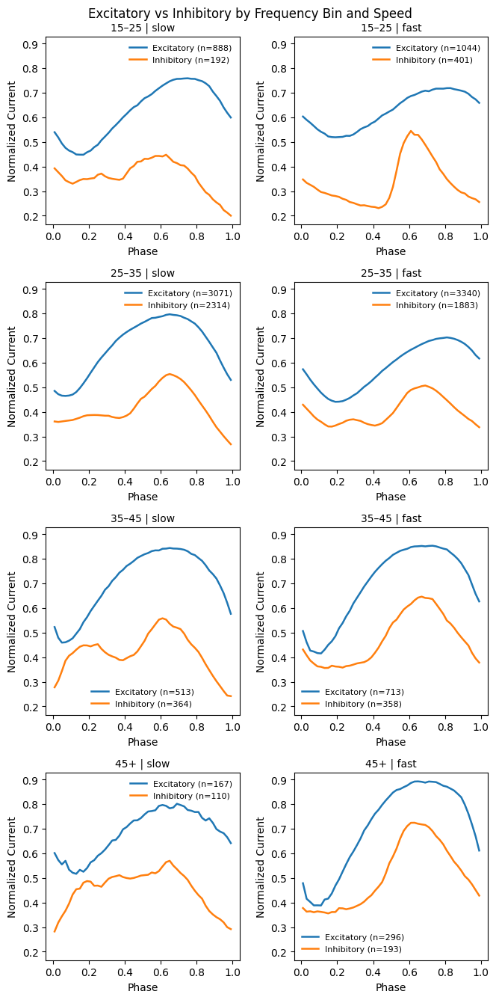

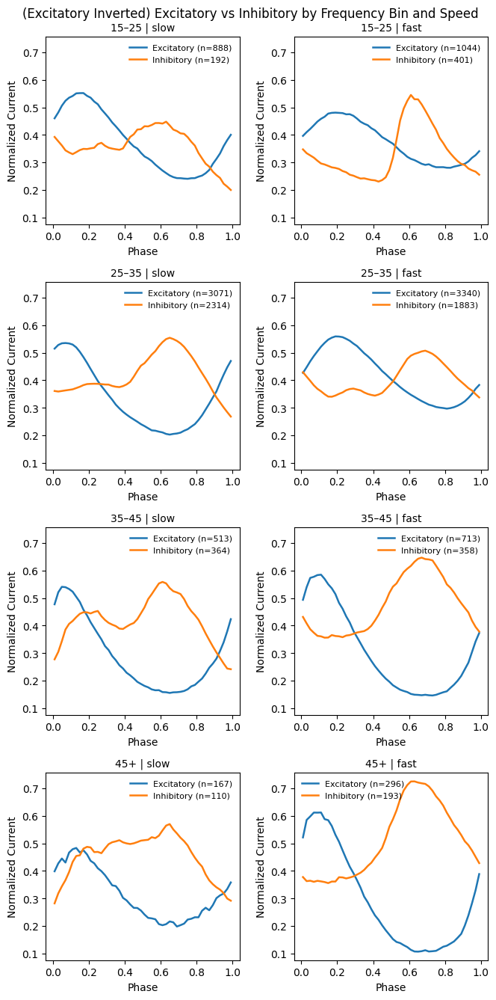

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt

def plot_overlay_by_bin_speed(
    key_counts,
    value_col="Normalized Current",   # or "Current"
    invert_excitatory=False,          # flip Excitatory sign if True
    ncols=3,
    linewidth=1.8,
    sharey=True,
    figsize_per_row=3.4,
    title_fontsize=10,
    suptitle=None
):
    """
    Create one subplot per (freq_bin, speed) and overlay Excitatory vs Inhibitory in different colors.

    Requirements:
      - average_waveforms_for_key(counter_key) is defined.
      - If invert_excitatory=True, average_waveforms_for_key_invert(counter_key) is used for Excitatory.
      - key_counts is a Counter keyed by (freq_bin, signal_type, speed) -> count.
    """
    # Sort order for panels
    freq_order = ["<15", "15–25", "25–35", "35–45", "45+"]
    speed_order = ["slow", "fast"]

    # What groups (freq_bin, speed) exist? (require at least one of E/I present)
    groups = set()
    for (fb, st, sp) in key_counts.keys():
        if st in ("Excitatory", "Inhibitory"):
            groups.add((fb, sp))

    if not groups:
        print("No Excitatory/Inhibitory keys found to plot.")
        return

    def sort_group(g):
        fb, sp = g
        return (
            freq_order.index(fb) if fb in freq_order else len(freq_order),
            speed_order.index(sp) if sp in speed_order else len(speed_order),
        )

    groups = sorted(groups, key=sort_group)

    # Helper to fetch averaged df (optionally inverting excitatory)
    def _avg_df(counter_key):
        fb, st, sp = counter_key
        if invert_excitatory and st == "Excitatory":
            return average_waveforms_for_key_invert(counter_key, invert_excitatory=True, value_col=value_col)
        return average_waveforms_for_key_median(counter_key)

    # Preload data & compute global ylim if sharey
    per_group = []
    ymins, ymaxs = [], []
    for fb, sp in groups:
        key_e = (fb, "Excitatory", sp)
        key_i = (fb, "Inhibitory", sp)

        df_e = _avg_df(key_e) if key_e in key_counts else None
        df_i = _avg_df(key_i) if key_i in key_counts else None

        per_group.append(((fb, sp), df_e, df_i))

        for df in (df_e, df_i):
            if df is not None and value_col in df:
                vals = df[value_col].to_numpy()
                if np.isfinite(vals).any():
                    ymins.append(np.nanmin(vals))
                    ymaxs.append(np.nanmax(vals))

    global_ylim = None
    if sharey and ymins and ymaxs:
        pad = 0.05 * (np.nanmax(ymaxs) - np.nanmin(ymins) + 1e-12)
        global_ylim = (np.nanmin(ymins) - pad, np.nanmax(ymaxs) + pad)

    # Layout
    n = len(per_group)
    nrows = math.ceil(n / ncols)
    figsize = (ncols * figsize_per_row, nrows * figsize_per_row)
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize, squeeze=False)
    axes = axes.ravel()

    # Plot each panel
    for ax, ((fb, sp), df_e, df_i) in zip(axes, per_group):
        # Counts for legend labels
        n_e = key_counts.get((fb, "Excitatory", sp), 0)
        n_i = key_counts.get((fb, "Inhibitory", sp), 0)

        plotted_any = False

        if df_e is not None and not df_e.empty and "Phase" in df_e and value_col in df_e:
            ax.plot(df_e["Phase"], df_e[value_col], linewidth=linewidth, label=f"Excitatory (n={n_e})")
            plotted_any = True

        if df_i is not None and not df_i.empty and "Phase" in df_i and value_col in df_i:
            ax.plot(df_i["Phase"], df_i[value_col], linewidth=linewidth, label=f"Inhibitory (n={n_i})")
            plotted_any = True

        if global_ylim is not None:
            ax.set_ylim(global_ylim)

        ax.axhline(0, lw=0.8, alpha=0.6)
        ax.set_title(f"{fb} | {sp}", fontsize=title_fontsize)
        ax.set_xlabel("Phase")
        ax.set_ylabel(value_col)
        if plotted_any:
            ax.legend(frameon=False, fontsize=8)
        else:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.set_axis_off()

    # Hide any extra axes
    for j in range(len(per_group), len(axes)):
        axes[j].set_axis_off()

    if suptitle:
        fig.suptitle(suptitle, fontsize=title_fontsize + 2, y=0.98)

    fig.tight_layout()
    plt.show()
# Overlay without inversion
plot_overlay_by_bin_speed(
    key_counts,
    value_col="Normalized Current",
    invert_excitatory=False,
    ncols=2,
    suptitle="Excitatory vs Inhibitory by Frequency Bin and Speed"
)

# Overlay with excitatory inverted
plot_overlay_by_bin_speed(
    key_counts,
    value_col="Normalized Current",
    invert_excitatory=True,
    ncols=2,
    suptitle="(Excitatory Inverted) Excitatory vs Inhibitory by Frequency Bin and Speed"
)


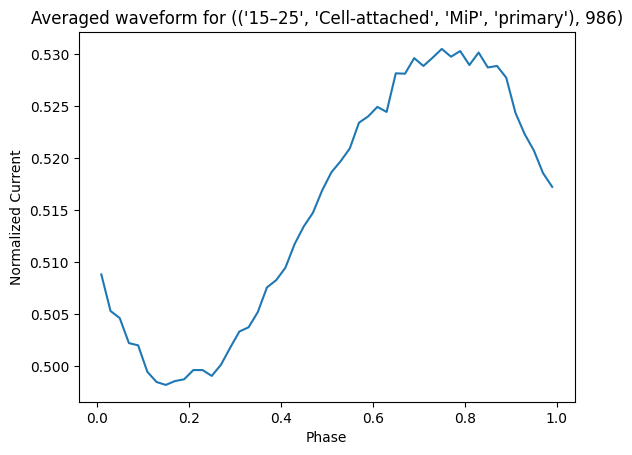

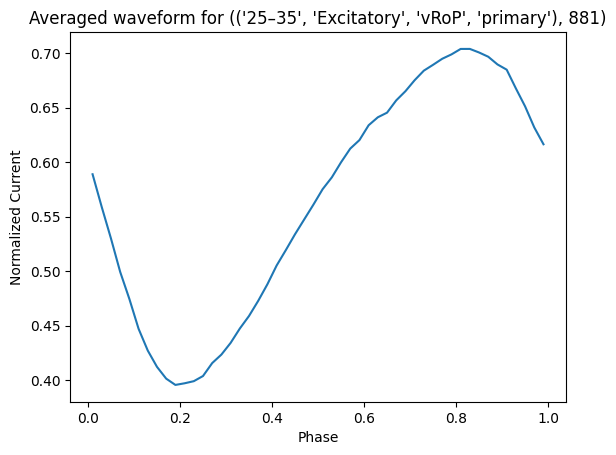

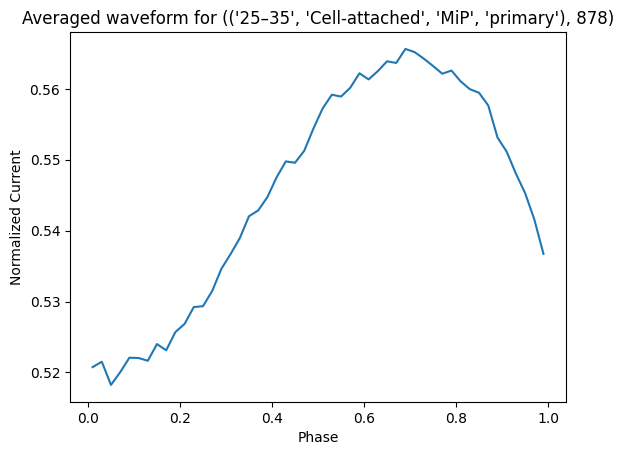

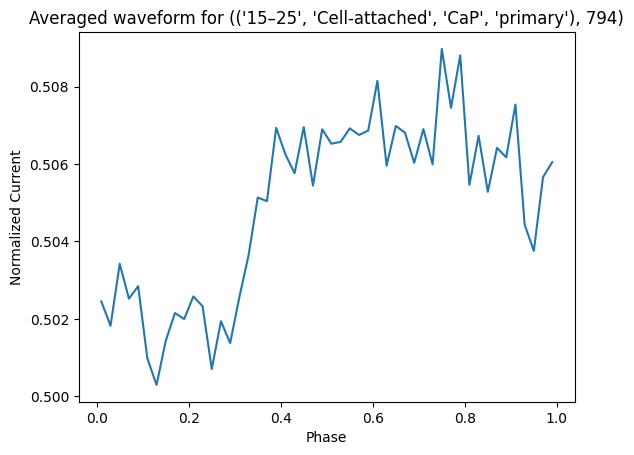

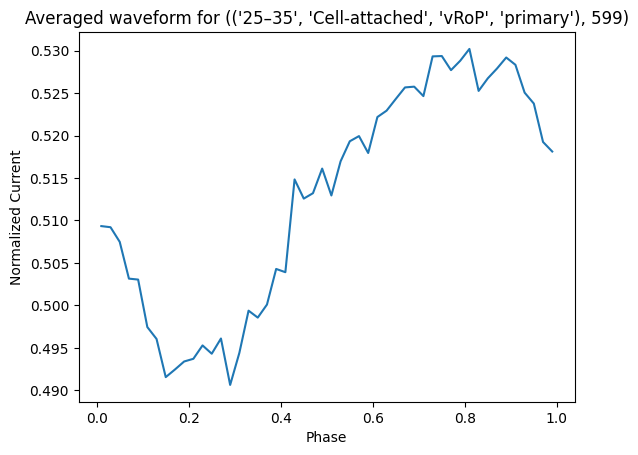

...

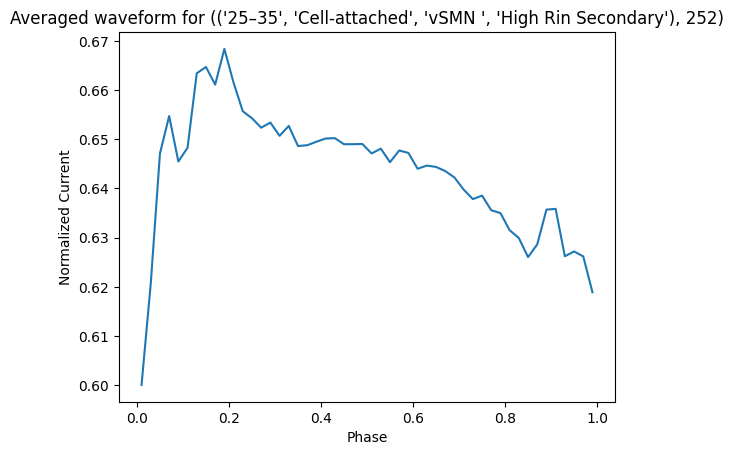

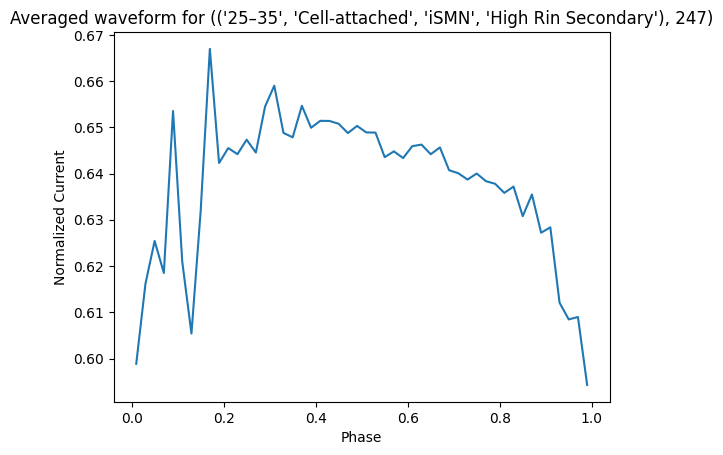

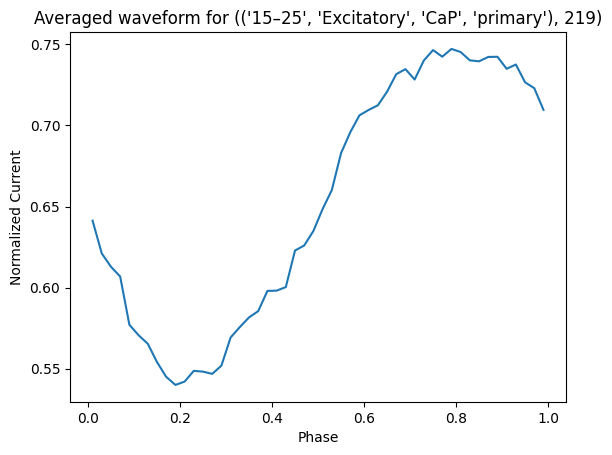

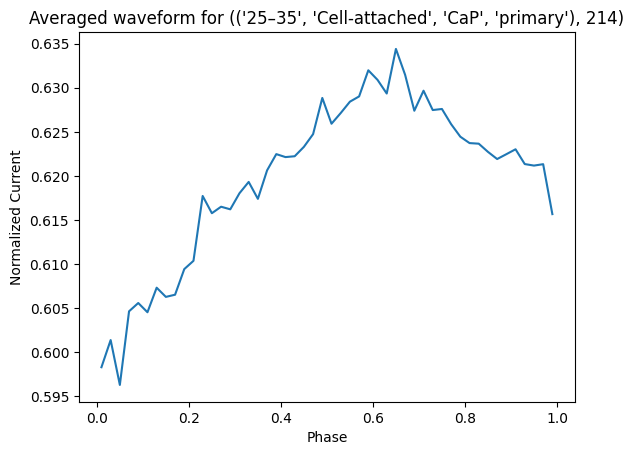

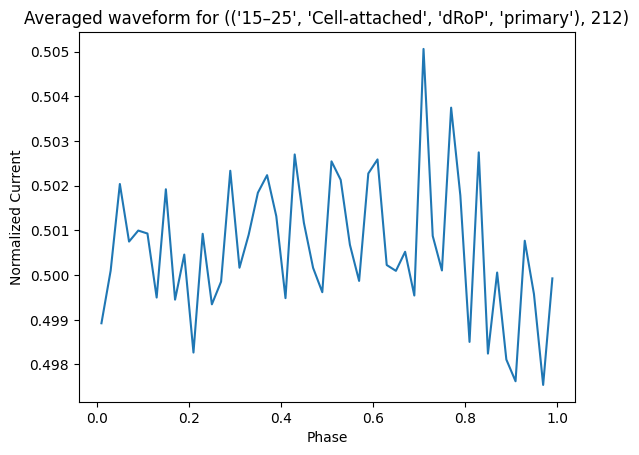

No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')


TypeError: 'NoneType' object is not subscriptable

In [ ]:
for key in key_counts.most_common():
    # print(key[0])
    avg_waveform_df = average_waveforms_for_key(key[0])
    plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'])
    plt.xlabel('Phase')
    plt.ylabel('Normalized Current')
    plt.title(f'Averaged waveform for {key}')
    plt.show()